In [1]:
import pandas as pd
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow import keras
from sklearn.metrics import mean_squared_error, r2_score

usamos las siguientes web para buscar jugadores transpasados, su valor de mercado y sustitutos:

https://www.transfermarkt.es/transfers/transfertagedetail/statistik/top/plus/0/galerie/0?land_id_ab=&land_id_zu=&leihe=true&datum=2022-09-01
https://www.espn.com.ar/futbol/nota/_/id/10654724/mercado-fichajes-europa-calificacion-mejores-clubes

https://www.transfermarkt.es/chelsea-fc/transfers/verein/631/saison_id/2022 # Esta web nos da los jugadores que han sido traspasados por el Chelsea en la temporada 2022 pero nos sirve ya que podemos cambiar el club para buscar los jugadores que han sido traspasados por el club que queramos.

(5905, 52)


/Users/catalin/.local/share/virtualenvs/IA-TFG-QjuetxQn/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 64)             │         3,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,585 (45.25 KB)

 Trainable params: 11,585 (45.25 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0124 - val_loss: 0.0056
Epoch 2/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0047 - val_loss: 0.0031
Epoch 3/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0021 - val_loss: 0.0026
Epoch 4/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0012 - val_loss: 0.0020
Epoch 5/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 9.8683e-04 - val_loss: 0.0021
Epoch 6/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 5.6306e-04 - val_loss: 0.0017
Epoch 7/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 8.3893e-04 - val_loss: 0.0014
Epoch 8/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 4.7957e-04 - val_loss: 0.0015
Epoch 9/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 3.0812e-04 - val_loss: 0.0015
Epoch 10/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 4.3478e-04 - val_loss: 0.0015
Epoch 11/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 4.6630e-04 - val_loss: 0.0017
Epoch 12/100
20/20 ━━━━━━━━━━━━━━━━

/Users/catalin/.local/share/virtualenvs/IA-TFG-QjuetxQn/lib/python3.11/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


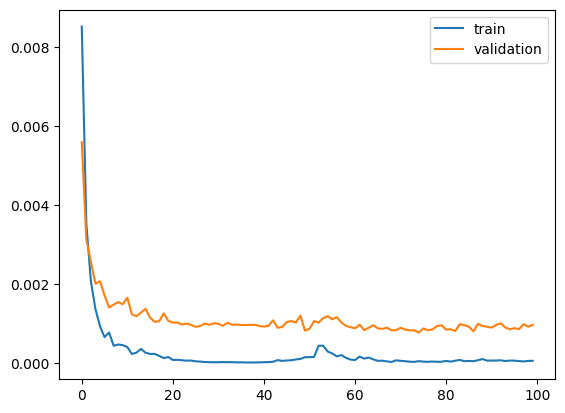

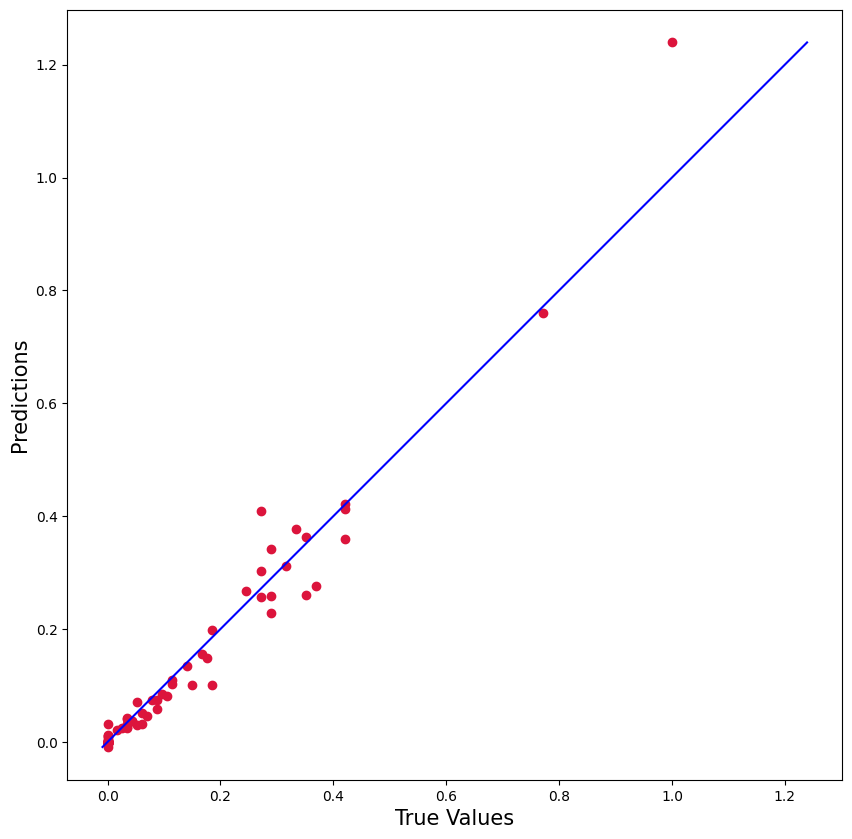

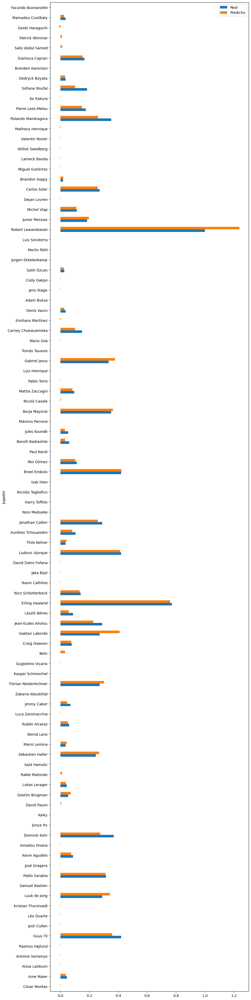

In [2]:
# creamos una semilla para que los resultados sean reproducibles
np.random.seed(42)

# Cargar los datos de características y valores a predecir
data = pd.read_csv("/Users/catalin/Documents/Programación/Proyectos/IA-TFG/data/input_data/Estadisticas_estandar.csv")

jugador_df = data[['Jugador']]

# Filter columns that contain "2017-2018" or "2021-2022" in their name
filtered_df = data.filter(regex='2017-2018|2018-2019|2019-2020|2020-2021|2021-2022')

# Select the last 4 columns
last_four_columns = data[['Position', 'Market Value', 'Transfer Type', 'Fee']]

# Concatenate the "Jugador" column, the filtered columns and the last 4 columns
acc_def_estudio = pd.concat([jugador_df, filtered_df, last_four_columns], axis=1)

# nos quedamos sin la columna
acc_def_estudio_sin_jugador = acc_def_estudio.drop(columns="Jugador")

corr_matrix = acc_def_estudio_sin_jugador.corr()

# seleccionamos todas las columnas que tienen una correlacion mayor a 0.1
fee_corr = corr_matrix["Fee"].sort_values(ascending=False)
high_corr = fee_corr[fee_corr > 0.15]


# Get the column names with high correlation
high_corr_columns = high_corr.index.tolist()

# Add the 'Jugador' column
high_corr_columns.append('Jugador')

# Create a new DataFrame with only the high correlation columns and 'Jugador'
high_corr_df = acc_def_estudio[high_corr_columns]
print(high_corr_df.shape)
high_corr_df.to_csv("/Users/catalin/Documents/Programación/Proyectos/IA-TFG/data/input_data/high_corr_df.csv", index=False)

high_corr_df = high_corr_df.dropna()

high_corr_df.head()

scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(high_corr_df.drop(columns=['Jugador', 'Fee']))

train_data, test_data = train_test_split(scaled_data, test_size=0.2, random_state=42)

X_train = train_data[:, :-1]
y_train = train_data[:, -1]
X_test = test_data[:, :-1]
y_test = test_data[:, -1]

# Create a neural network model
model = keras.models.Sequential()
model.add(keras.layers.Dense(64, activation='relu', input_shape=(X_train.shape[1],)))
model.add(keras.layers.Dense(64, activation='relu'))
model.add(keras.layers.Dense(64, activation='relu'))
model.add(keras.layers.Dense(1))
model.summary()


model.compile(optimizer='adam', loss='mean_squared_error')


history = model.fit(X_train, y_train, epochs=100, batch_size=16, validation_split=0.2, verbose=1)

# For prediction we require testing data, so we first create the testing data and then proceed with the model prediction.

y_pred = model.predict(X_test)


# Realizar predicciones en todo el conjunto de datos
y_pred_all = model.predict(scaled_data[:, :-1])

# Evaluamos el modelo
from sklearn.metrics import mean_squared_error, r2_score

# Calculate the root mean squared error (RMSE)
rmse = mean_squared_error(y_test, y_pred, squared=False)
print(f'Root Mean Squared Error: {rmse}')

# Calculate the coefficient of determination (R^2 score)
r2 = r2_score(y_test, y_pred)
print(f'R^2 Score: {r2}')

#todo: ver pq tenemos 2 metricas de r2_score y rmse cual es la correcta?


# Realiza una grafica de la perdida del modelo
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='validation')
plt.legend()
plt.show()


# Realiza una grafica con los valores reales y el nombre de los jugadores vs los valores predichos
plt.figure(figsize=(10, 10))
y_test = y_test.flatten()
y_pred = y_pred.flatten()
plt.scatter(y_test, y_pred, c='crimson')
    
p1 = max(max(y_pred), max(y_test))
p2 = min(min(y_pred), min(y_test))
plt.plot([p1, p2], [p1, p2], 'b-')
plt.xlabel('True Values', fontsize=15)
plt.ylabel('Predictions', fontsize=15)
plt.axis('equal')
plt.show()


# Realiza una grafica de barras con el valor real y el nombre del jugador vs el valor predicho
# Get the 'Jugador' column before it's dropped
jugador = high_corr_df['Jugador']

# Split the data again after scaling but this time keep the 'Jugador' column
train_data, test_data = train_test_split(high_corr_df, test_size=0.2, random_state=42)

# Get the 'Jugador' column from the test data
jugador_test = test_data['Jugador']

# Flatten the y_test and y_pred arrays
y_test_flattened = y_test.flatten()
y_pred_flattened = y_pred.flatten()

# Create a DataFrame with the player names and the real and predicted values
df = pd.DataFrame({'Jugador': jugador_test, 'Real': y_test_flattened, 'Predicho': y_pred_flattened})

# Set the 'Jugador' column as the index
df.set_index('Jugador', inplace=True)

# Plot the DataFrame
df.plot.barh(rot=0, figsize=(10,50))

# Show the plot
plt.show()

In [3]:
# Ajustar el scaler solo con la columna de tarifas
fee_scaler = MinMaxScaler()
fee_scaler.fit(data[['Fee']])

def predict_fee(player_name):
    # Filtrar el DataFrame para obtener las filas que corresponden al jugador
    player_data = data[data['Jugador'] == player_name]

    # Verificar si hay datos para el jugador
    if player_data.empty:
        return "No se encontraron datos para el jugador: {}".format(player_name)

    # Aplicar las mismas transformaciones que se aplicaron a los datos de entrenamiento
    player_data_filtered = player_data[high_corr_columns].dropna()

    # Verificar si hay datos después de eliminar los valores faltantes
    if player_data_filtered.empty:
        return "No se encontraron datos suficientes para el jugador: {}".format(player_name)

    player_data_scaled = scaler.transform(player_data_filtered.drop(columns=['Jugador', 'Fee']))

    # Utilizar el modelo para hacer una predicción con los datos transformados
    fee_prediction_scaled = model.predict(player_data_scaled[:, :-1])

    # Desescalar la predicción
    fee_prediction = fee_scaler.inverse_transform(fee_prediction_scaled)

    # Devolver la predicción
    print(f"El valor de mercado predicho para el jugador {player_name} es: {fee_prediction[0][0]} millones de euros")
    return fee_prediction[0][0]

In [4]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import NearestNeighbors

 #todo: aplciar rmse y R2 a knn
def knn(nombre_jugador_entrada: str, k: int):
    # data = pd.read_csv("/Users/catalin/Documents/Programación/Proyectos/IA-TFG/data/input_data/Estadisticas_estandar.csv", index_col=1)

    # En vez de cargar el dataset original, cargamos el dataset con las columnas con alta correlacion igual que en el modelo
    data = pd.read_csv("/Users/catalin/Documents/Programación/Proyectos/IA-TFG/data/input_data/high_corr_df.csv", index_col=-1)

    # check for missing values and impute with mean if present
    if data.isnull().sum().sum() > 0:
        data = data.fillna(data.mean())

    # obtenemos las caracteristicas del jugador de entrada
    caract_jugador_entrada = data.loc[nombre_jugador_entrada]

    # creamos el conjunto / dataframe excluyendo el jugador de entrada
    entrenamiento = data.drop(nombre_jugador_entrada)

    # creamos el conjunto de prueba con el jugador de entrada
    # prueba = nombre_jugador_entrada


    # Normalizamos los datos para que todas las caracteristicas tengan la misma escala para poder compararlas

    scaler = MinMaxScaler()
    scaler.fit(entrenamiento)

    entrenamiento_normalizado = scaler.transform(entrenamiento)
    prueba_normalizado = scaler.transform([caract_jugador_entrada])

    neighbors = NearestNeighbors(n_neighbors=k, algorithm='ball_tree')
    neighbors.fit(entrenamiento_normalizado)

    distancias, indices = neighbors.kneighbors(prueba_normalizado)
    # Evaluamos el modelo -> todo:
    

    # mostramos los k vecinos mas cercanos
    print(f"Los {k} jugadores más similares a {nombre_jugador_entrada} son:")
    for i in range(k):
        print(f"{i+1} {entrenamiento.iloc[indices[0][i]].name} con una distancia de {distancias[0][i]}")
    print("\n")




In [5]:

def plot_radar_chart(players: list):
    # Cargamos los datos
    data = pd.read_csv("/Users/catalin/Documents/Programación/Proyectos/IA-TFG/data/input_data/high_corr_df.csv", index_col=-1)

    # Normalizamos los datos
    scaler = MinMaxScaler()
    data_normalized = scaler.fit_transform(data)

    # Convertimos los datos normalizados a DataFrame
    data_normalized = pd.DataFrame(data_normalized, columns=data.columns, index=data.index)

    # Obtenemos las estadísticas de los jugadores
    players_stats = data_normalized.loc[players]

    # Número de variables que vamos a mostrar en el gráfico de radar
    num_vars = len(players_stats.columns)

    # Calculamos el ángulo de cada eje en el gráfico (dividimos la circunferencia total de 2pi por el número de variables)
    angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

    # Hacemos que el gráfico sea circular
    angles += angles[:1]

    # Inicializamos el gráfico
    fig, ax = plt.subplots(figsize=(17, 17), subplot_kw=dict(polar=True))

    # Dibujamos cada jugador en el gráfico de radar
    for player, stats in players_stats.iterrows():
        stats = stats.tolist()
        stats += stats[:1]  # aseguramos que el gráfico se cierre volviendo al primer valor
        ax.plot(angles, stats, label=player)

    # Añadimos etiquetas
    ax.set_thetagrids(np.degrees(angles[:-1]), players_stats.columns)
    ax.set_title('Comparación de jugadores')

    # Añadimos una leyenda
    ax.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))

    # Mostramos el gráfico con un layout ajustado
    # plt.tight_layout()
    plt.show()

In [6]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import NearestNeighbors
from scipy.spatial import distance

def calculate_distance(player1: str, player2: str):

    # data = pd.read_csv("/Users/catalin/Documents/Programación/Proyectos/IA-TFG/data/input_data/Estadisticas_estandar.csv", index_col=1)
    #  En vez de cargar el dataset original, cargamos el dataset con las columnas con alta correlacion igual que en el modelo
    data = pd.read_csv("/Users/catalin/Documents/Programación/Proyectos/IA-TFG/data/input_data/high_corr_df.csv", index_col=-1)
    
    # check for missing values and impute with mean if present
    if data.isnull().sum().sum() > 0:
        data = data.fillna(data.mean())

    # obtenemos las caracteristicas de los jugadores
    player1_features = data.loc[player1]
    player2_features = data.loc[player2]

    # creamos el conjunto / dataframe excluyendo los jugadores
    training_data = data.drop([player1, player2])

    # Normalizamos los datos para que todas las caracteristicas tengan la misma escala para poder compararlas
    scaler = MinMaxScaler()
    scaler.fit(training_data)

    player1_normalized = scaler.transform([player1_features]).flatten()
    player2_normalized = scaler.transform([player2_features]).flatten()

    # calculamos la distancia entre los dos jugadores
    dist = distance.euclidean(player1_normalized, player2_normalized)

    print(f"La distancia entre {player1} y {player2} es {dist}")

In [7]:
def compare_players(player1: str, player2: str, year: str):
    # Cargamos los datos
    first_player_df = pd.read_csv("/Users/catalin/Documents/Programación/Proyectos/IA-TFG/data/input_data/high_corr_df.csv", index_col=-1)
    second_player_df = pd.read_csv("/Users/catalin/Documents/Programación/Proyectos/IA-TFG/data/input_data/Estadisticas_estandar.csv", index_col=1)

    # Filtramos los datos para el año siguiente
    filtered_df = second_player_df.filter(regex=year)

    # Obtenemos las estadísticas de los jugadores para el año siguiente
    player1_stats = filtered_df.loc[player1]
    player2_stats = filtered_df.loc[player2]

    # Comparamos las estadísticas
    comparison = player1_stats - player2_stats

    # Sumamos todas las diferencias
    total_difference = comparison.sum()

    # Evaluamos el rendimiento del jugador 2 en comparación con el jugador 1
    if total_difference < 0:
        print(f"{player2} ha sido mejor que {player1} en el año {year}.")
    elif total_difference > 0:
        print(f"{player2} ha sido peor que {player1} en el año {year}.")
    else:
        print(f"{player2} ha tenido un rendimiento igual a {player1} en el año {year}.")



In [8]:
import warnings
warnings.filterwarnings('ignore')

# Aurelien Tchouameni 80M

In [9]:
Aurelien = 'Aurélien Tchouaméni'

Los 20 jugadores más similares a Casemiro son:
1 Aurélien Tchouaméni con una distancia de 0.6710953471510185
2 Rúben Neves con una distancia de 0.7664954199082239
3 Joan Jordán con una distancia de 0.8125689034027207
4 Mauro Arambarri con una distancia de 0.814832940974039
5 Nikola Milenković con una distancia de 0.8245301145004251
6 Douglas Luiz con una distancia de 0.8279019493305713
7 Davide Faraoni con una distancia de 0.8362408510819473
8 Gianluca Mancini con una distancia de 0.8499668776047984
9 John McGinn con una distancia de 0.852073930639622
10 Nicolas Höfler con una distancia de 0.8550071542505894
11 Benjamin André con una distancia de 0.8624619591853564
12 Harry Maguire con una distancia de 0.8722905754551413
13 Bryan Cristante con una distancia de 0.8790931347370246
14 Koke con una distancia de 0.8876840800257331
15 Damián Suárez con una distancia de 0.8914250348573263
16 Baptiste Santamaria con una distancia de 0.893014926152324
17 Maximilian Arnold con una distancia de 0

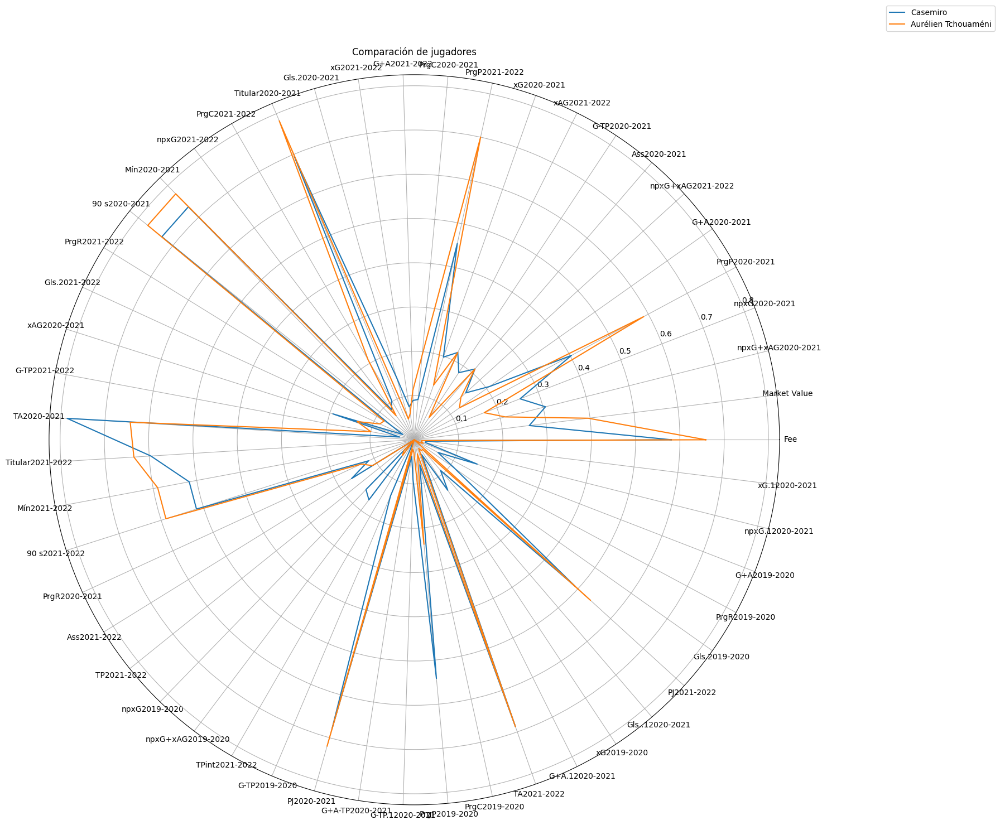

In [10]:
# Real Madrid
knn(nombre_jugador_entrada='Casemiro', k=20)
compare_players('Casemiro', Aurelien, '2022-2023')
calculate_distance('Casemiro', Aurelien)
predict_fee(Aurelien)
plot_radar_chart(['Casemiro', Aurelien])

# Raphinha 58 M

Los 10 jugadores más similares a Memphis son:
1 Karl Toko Ekambi con una distancia de 0.9994814077863001
2 Henrikh Mkhitaryan con una distancia de 1.1186636079398815
3 Raphinha con una distancia de 1.1458368921185835
4 Mikel Oyarzabal con una distancia de 1.187405593137131
5 Amine Gouiri con una distancia de 1.1886478333708665
6 Andy Delort con una distancia de 1.1973185917431906
7 Iago Aspas con una distancia de 1.2360559301449165
8 Bruno Fernandes con una distancia de 1.2390869991124087
9 André Silva con una distancia de 1.2465014833027876
10 Antoine Griezmann con una distancia de 1.268660349037491


Raphinha ha sido mejor que Memphis en el año 2022-2023.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
El valor de mercado predicho para el jugador Raphinha es: 43.94318771362305 millones de euros
La distancia entre Memphis y Raphinha es 1.1458368921185835


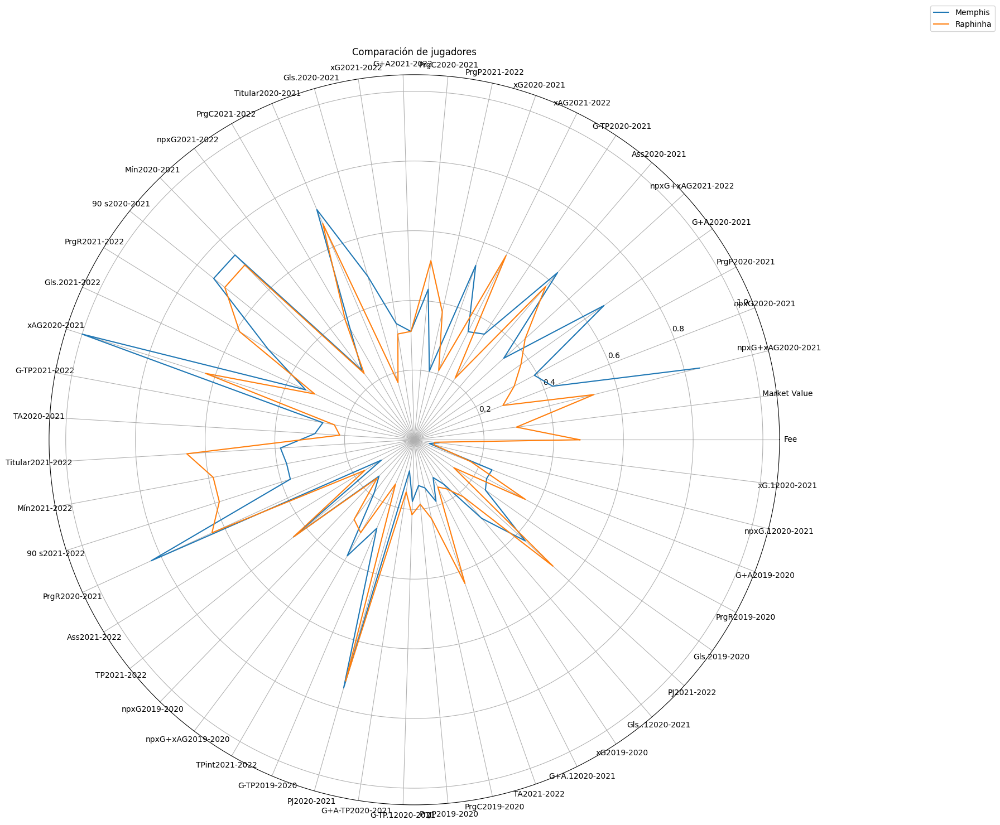

In [11]:
knn(nombre_jugador_entrada='Memphis', k=10) # Su sustituto es Raphinha -> es un buen ejemplo del modelo de KNN
compare_players('Memphis', 'Raphinha', '2022-2023')
predict_fee('Raphinha')
calculate_distance('Memphis', 'Raphinha')
plot_radar_chart(['Memphis', 'Raphinha'])

# Kalidou Koulibaly 42M
Podemos concluir que no se predice bien el valor de Koulibaly ya que valió 42M€

Hemos buscados los jugadores más parecidos a los jugadores que se han ido del chelsea en ese mercados de fichajes

Podemos concluir que ha sido mejor que Rudiguer pero peor que Christensen

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
El valor de mercado predicho para el jugador Kalidou Koulibaly es: 3.6829512119293213 millones de euros
Los 20 jugadores más similares a Malang Sarr son:
1 Fran Mérida con una distancia de 0.13835096249105788
2 Aleš Matějů con una distancia de 0.17458253449491745
3 Danny Rose con una distancia de 0.19641420811467314
4 Benjamin Hübner con una distancia de 0.22327079659857121
5 Oghenekaro Etebo con una distancia de 0.23261766338511067
6 Fabian Delph con una distancia de 0.23287027985060094
7 Mato Jajalo con una distancia de 0.24986335256563602
8 Javier Pastore con una distancia de 0.25245121075378985
9 Mathias Jørgensen con una distancia de 0.25398914833684616
10 Ronaldo Vieira con una distancia de 0.25798937158859075
11 Aleix Febas con una distancia de 0.26430659168843734
12 Hans Nunoo Sarpei con una distancia de 0.2712149523247691
13 Víctor Camarasa con una distancia de 0.2716109853704593
14 David López con una distancia de 0.2718730464824206
15 Lu

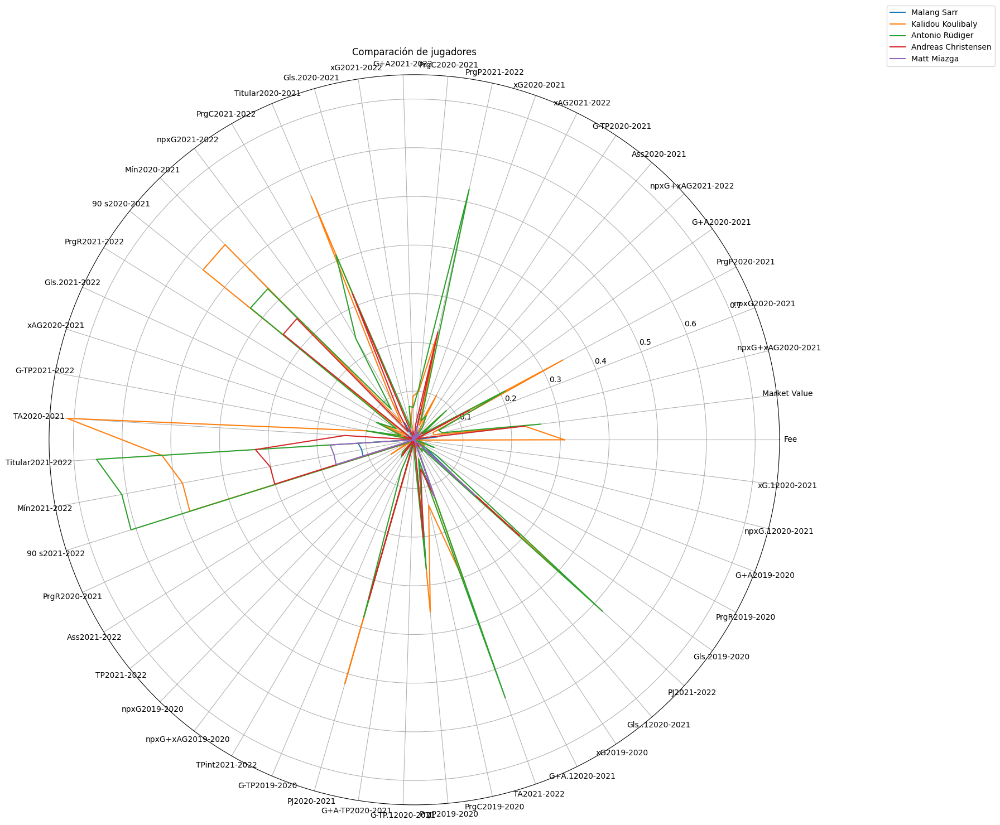

In [12]:
predict_fee('Kalidou Koulibaly') # Valio 42M
knn(nombre_jugador_entrada='Malang Sarr', k=20)
knn(nombre_jugador_entrada='Antonio Rüdiger', k=20)
knn(nombre_jugador_entrada='Andreas Christensen', k=20)
knn(nombre_jugador_entrada='Matt Miazga', k=20)
compare_players('Antonio Rüdiger', 'Kalidou Koulibaly', '2022-2023')
compare_players('Andreas Christensen', 'Kalidou Koulibaly', '2022-2023')
plot_radar_chart(['Malang Sarr', 'Kalidou Koulibaly', 'Antonio Rüdiger', 'Andreas Christensen', 'Matt Miazga'])

# Raheem Sterling
El chelsea en este mercado de fichajes a vendido a su delantero Timo Werner por 20 millones y ha comrpado a:

Raheem Sterling por 56,2 millones



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
El valor de mercado predicho para el jugador Raheem Sterling es: 44.90204620361328 millones de euros
Los 10 jugadores más similares a Timo Werner son:
1 Marcus Rashford con una distancia de 1.0111421062809012
2 Jamie Vardy con una distancia de 1.086700474244448
3 Jadon Sancho con una distancia de 1.1299598954885026
4 Andrea Belotti con una distancia de 1.1353886364709904
5 Pierre-Emerick Aubameyang con una distancia de 1.1467441573023869
6 Roberto Firmino con una distancia de 1.153825132787374
7 Danny Ings con una distancia de 1.1746040425523616
8 Gerard Moreno con una distancia de 1.2217255178767734
9 Duván Zapata con una distancia de 1.2386278894505574
10 Raheem Sterling con una distancia de 1.2540604869054677


Raheem Sterling ha sido peor que Timo Werner en el año 2022-2023.
La distancia entre Timo Werner y Raheem Sterling es 1.256317959460311


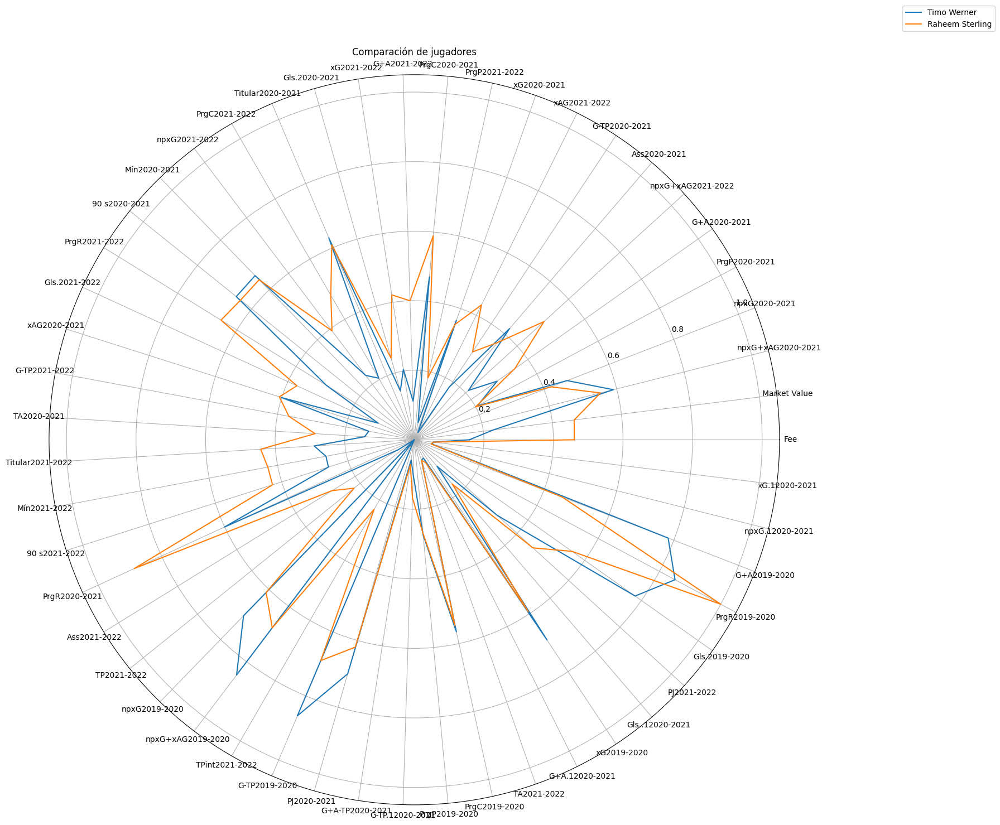

In [13]:
predict_fee('Raheem Sterling') # Valio 56,2

knn(nombre_jugador_entrada='Timo Werner', k=10)
compare_players('Timo Werner', 'Raheem Sterling', '2022-2023')

calculate_distance('Timo Werner', 'Raheem Sterling')

plot_radar_chart(['Timo Werner', 'Raheem Sterling',])

# Gabriel Jesus
El arsenal busca un delantero y compra a Gabriel Jesus por 52,20 millones ya que ha vendido a Lacazette, Nicolas Pepe

Ninguno de los jugadores del knn se parece a Gabriel Jesus pero podemos concluir que ha sido mejor que Lacazette y Nicolas Pepe

VERLO CON LA GRAFICA Y NO CON EL COMPARE PLAYER

In [14]:
Gabriel = 'Gabriel Jesus'
Alexandre = 'Alexandre Lacazette'
Nicolas = 'Nicolas Pépé'

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
El valor de mercado predicho para el jugador Gabriel Jesus es: 46.28104782104492 millones de euros
Los 20 jugadores más similares a Alexandre Lacazette son:
1 Ante Budimir con una distancia de 0.5407077636906118
2 Fabio Quagliarella con una distancia de 0.5586663818094323
3 Kasper Dolberg con una distancia de 0.6188620672932434
4 Habib Diallo con una distancia de 0.6572042502051972
5 Willian José con una distancia de 0.6691661553802704
6 Kelechi Iheanacho con una distancia de 0.6756392226182535
7 Santi Mina con una distancia de 0.6779667722791656
8 Roger Martí con una distancia de 0.6853123594618858
9 Mama Samba Baldé con una distancia de 0.691507930576618
10 Jorge Molina con una distancia de 0.7058711620295199
11 Zlatan Ibrahimović con una distancia de 0.7235400828677021
12 Borja Mayoral con una distancia de 0.7272602249708054
13 Antonio Sanabria con una distancia de 0.7288119361678052
14 Callum Wilson con una distancia de 0.729013364117835
15 Irv

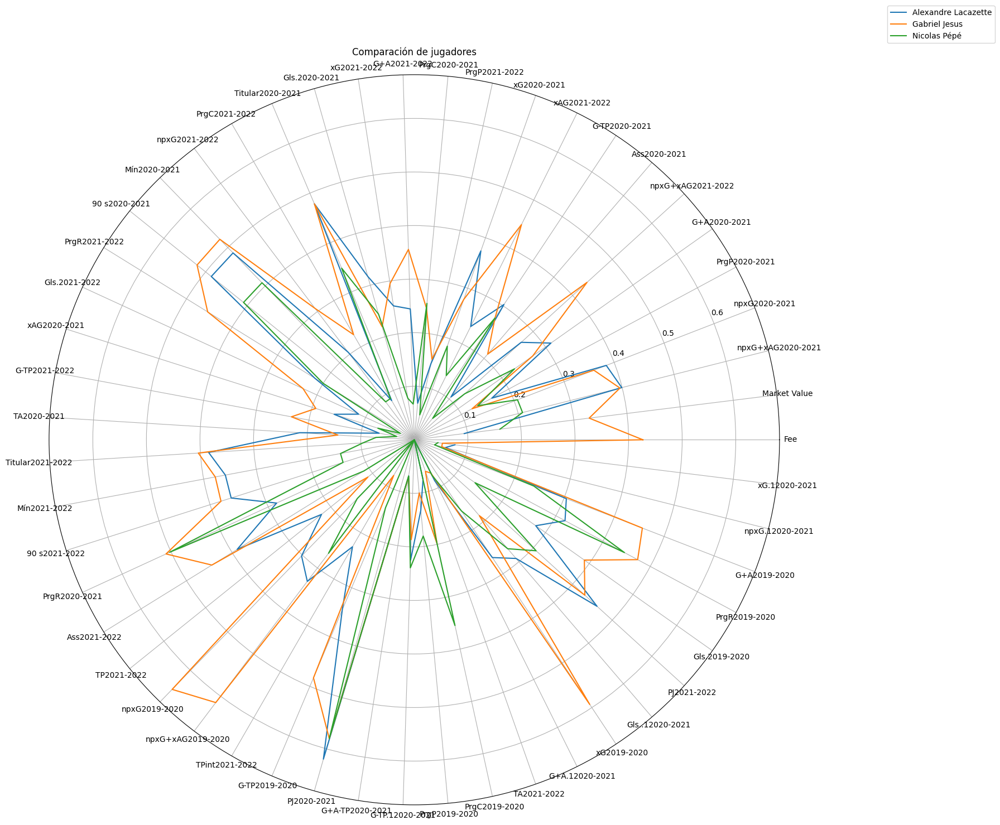

In [15]:
predict_fee('Gabriel Jesus')
knn(nombre_jugador_entrada='Alexandre Lacazette', k=20)
knn(nombre_jugador_entrada='Nicolas Pépé', k=20)
compare_players('Alexandre Lacazette', 'Gabriel Jesus', '2022-2023')
compare_players('Nicolas Pépé', 'Gabriel Jesus', '2022-2023')

calculate_distance('Alexandre Lacazette', 'Gabriel Jesus')
calculate_distance('Nicolas Pépé', 'Gabriel Jesus')

plot_radar_chart(['Alexandre Lacazette', 'Gabriel Jesus', 'Nicolas Pépé'])

# Kalvin Phillips -> no es un buen ejemplo
El city ha comprado a Kalvin Phillips por 49 millones.
Estaba buscando un Mediocentro defensivo suplente para Rodri

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
El valor de mercado predicho para el jugador Kalvin Phillips es: 6.8807692527771 millones de euros
Los 20 jugadores más similares a Rodri son:
1 Pierre Højbjerg con una distancia de 0.7772577332935771
2 Declan Rice con una distancia de 0.8782627961550171
3 Marcelo Brozović con una distancia de 0.8953244299686804
4 Youri Tielemans con una distancia de 0.9101877903767325
5 Rúben Neves con una distancia de 0.9146448597341368
6 Sergio Busquets con una distancia de 0.9271177339644512
7 João Moutinho con una distancia de 0.9572316280268348
8 John McGinn con una distancia de 0.9644040290889703
9 Frenkie de Jong con una distancia de 0.9663969976852131
10 Koke con una distancia de 0.9964714931572606
11 Remo Freuler con una distancia de 1.0071108603668415
12 Boubacar Kamara con una distancia de 1.0074049838360606
13 Marten de Roon con una distancia de 1.0128563728411832
14 Daniel Parejo con una distancia de 1.0176240806424526
15 Fabián Ruiz Peña con una dist

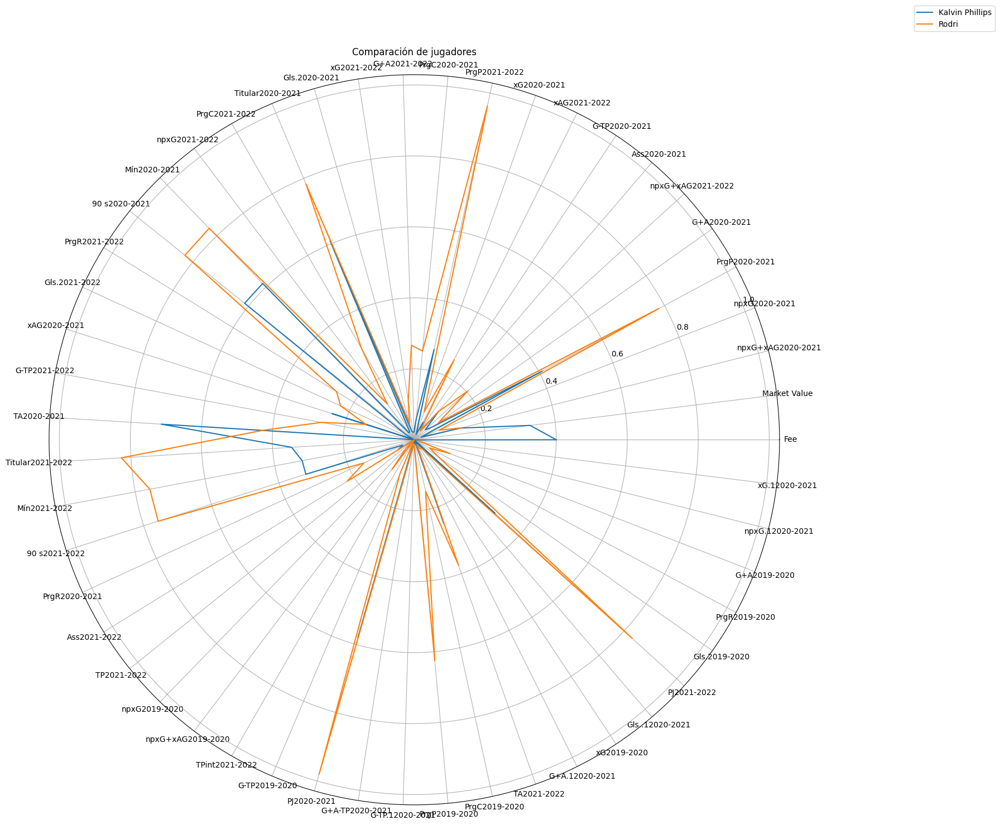

In [16]:
predict_fee('Kalvin Phillips') # Valio
knn(nombre_jugador_entrada='Rodri', k=20)
calculate_distance('Kalvin Phillips', 'Rodri')
compare_players('Kalvin Phillips', 'Rodri', '2022-2023')
plot_radar_chart(['Kalvin Phillips', 'Rodri'])

# Darwin Núñez -> No es un buen ejemplo
El liverpool buscaba un delantero centro / extremo para sustituir a Sadio Mané, Takumi Minamino y Divock Origi

Los 20 jugadores más similares a Sadio Mané son:
1 Raheem Sterling con una distancia de 0.8700633621138596
2 Son Heung-min con una distancia de 1.1224634546033339
3 Karl Toko Ekambi con una distancia de 1.1628098953989128
4 Duván Zapata con una distancia de 1.1827192862106313
5 Iago Aspas con una distancia de 1.2167946533628515
6 Serge Gnabry con una distancia de 1.237021870296567
7 Pierre-Emerick Aubameyang con una distancia de 1.2502911439884377
8 Gaëtan Laborde con una distancia de 1.254306542655578
9 Andy Delort con una distancia de 1.2593407344676193
10 Edin Džeko con una distancia de 1.2906384097968349
11 Lautaro Martínez con una distancia de 1.3157732612983393
12 Lucas Ocampos con una distancia de 1.337242565958089
13 Andrej Kramarić con una distancia de 1.3389416790764206
14 Jamie Vardy con una distancia de 1.3491382363975315
15 Michail Antonio con una distancia de 1.3595079505424963
16 Richarlison con una distancia de 1.3607164926669426
17 Denis Bouanga con una distancia de 1.

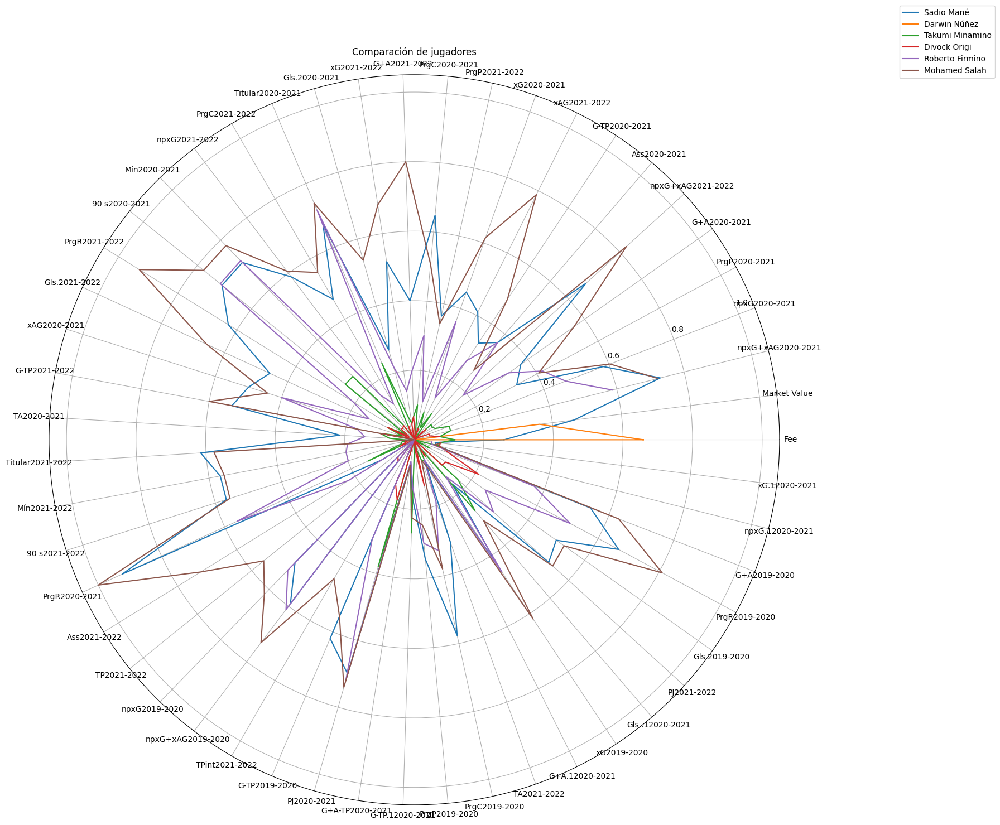

In [17]:
knn(nombre_jugador_entrada='Sadio Mané', k=20)
knn(nombre_jugador_entrada='Takumi Minamino', k=20)
knn(nombre_jugador_entrada='Divock Origi', k=20)
knn(nombre_jugador_entrada='Roberto Firmino', k=20)
knn(nombre_jugador_entrada='Mohamed Salah', k=20)
predict_fee('Darwin Núñez')
compare_players('Sadio Mané', 'Darwin Núñez', '2022-2023')
compare_players('Takumi Minamino', 'Darwin Núñez', '2022-2023')
compare_players('Divock Origi', 'Darwin Núñez', '2022-2023')
compare_players('Roberto Firmino', 'Darwin Núñez', '2022-2023')
compare_players('Mohamed Salah', 'Darwin Núñez', '2022-2023')

calculate_distance('Sadio Mané', 'Darwin Núñez')
calculate_distance('Takumi Minamino', 'Darwin Núñez')
calculate_distance('Divock Origi', 'Darwin Núñez')
calculate_distance('Roberto Firmino', 'Darwin Núñez')
calculate_distance('Mohamed Salah', 'Darwin Núñez')

plot_radar_chart(['Sadio Mané', 'Darwin Núñez', 'Takumi Minamino', 'Divock Origi', 'Roberto Firmino', 'Mohamed Salah'])

# Erling Haaland
El city busca un delantero centro para sustituir a Gabriel Jesus:
ha comprado a haaland por 60 millones

Podemos concluir que ha sido mejor que Gabriel Jesus

Los 20 jugadores más similares a Gabriel Jesus son:
1 Edin Džeko con una distancia de 0.7992120010605018
2 Álvaro Morata con una distancia de 0.8064153581491198
3 Danny Ings con una distancia de 0.8154954520929354
4 Alassane Pléa con una distancia de 0.8408083981895679
5 Pierre-Emerick Aubameyang con una distancia de 0.9212233333063844
6 Francesco Caputo con una distancia de 0.9316071634400305
7 Breel Embolo con una distancia de 0.9336364370650858
8 Michail Antonio con una distancia de 0.9354643040731219
9 Victor Osimhen con una distancia de 0.9389940118750072
10 Neal Maupay con una distancia de 0.9697547282562532
11 Serge Gnabry con una distancia de 0.9807659337847742
12 Alexandre Lacazette con una distancia de 0.9888633233218996
13 Harvey Barnes con una distancia de 0.9936933688813157
14 Riccardo Orsolini con una distancia de 1.0040914724969878
15 Kai Havertz con una distancia de 1.0058145257599118
16 Paulo Dybala con una distancia de 1.0105623890456172
17 Richarlison con una distanc

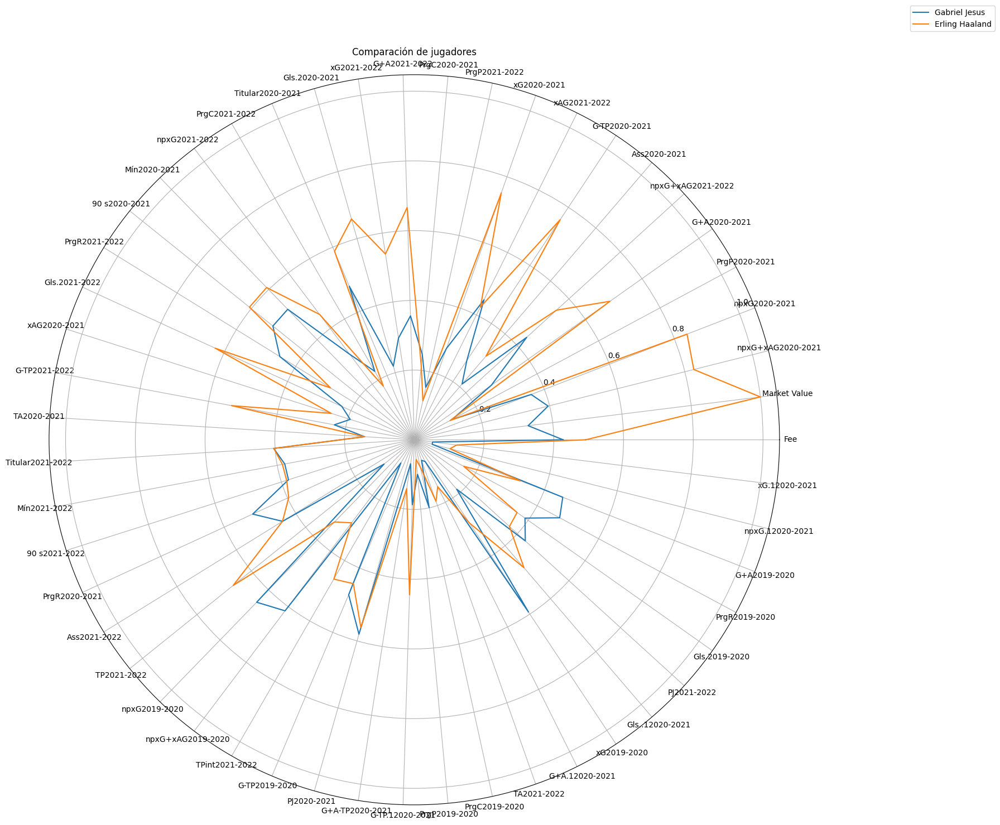

In [18]:
knn(nombre_jugador_entrada='Gabriel Jesus', k=20)
predict_fee('Erling Haaland')
compare_players('Gabriel Jesus', 'Erling Haaland', '2022-2023')
calculate_distance('Gabriel Jesus', 'Erling Haaland')
plot_radar_chart(['Gabriel Jesus', 'Erling Haaland'])

# Richarlison
El tottenham busca un delantero centro para parecido a Harry Kane y a Heung-Min Son, Steven Bergwijn, Giovani Lo Celso

Richarlison se ha comprado por 58 millones

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


El valor de mercado predicho para el jugador Richarlison es: 32.14809799194336 millones de euros
Los 20 jugadores más similares a Harry Kane son:
1 Son Heung-min con una distancia de 1.0822274853902099
2 Andy Delort con una distancia de 1.0893309085524039
3 Gaëtan Laborde con una distancia de 1.0900440239092404
4 Wissam Ben Yedder con una distancia de 1.118234663978252
5 Lautaro Martínez con una distancia de 1.143859606387785
6 Wout Weghorst con una distancia de 1.1566500685081116
7 Domenico Berardi con una distancia de 1.1694342048255293
8 Karl Toko Ekambi con una distancia de 1.1792062755787192
9 Iago Aspas con una distancia de 1.1888484818622556
10 Karim Benzema con una distancia de 1.1910059239038489
11 André Silva con una distancia de 1.1928751226357388
12 Andrej Kramarić con una distancia de 1.2141921789147316
13 Kevin Volland con una distancia de 1.2482785609171485
14 Duván Zapata con una distancia de 1.2612531501102089
15 Ludovic Ajorque con una distancia de 1.2826903050611131


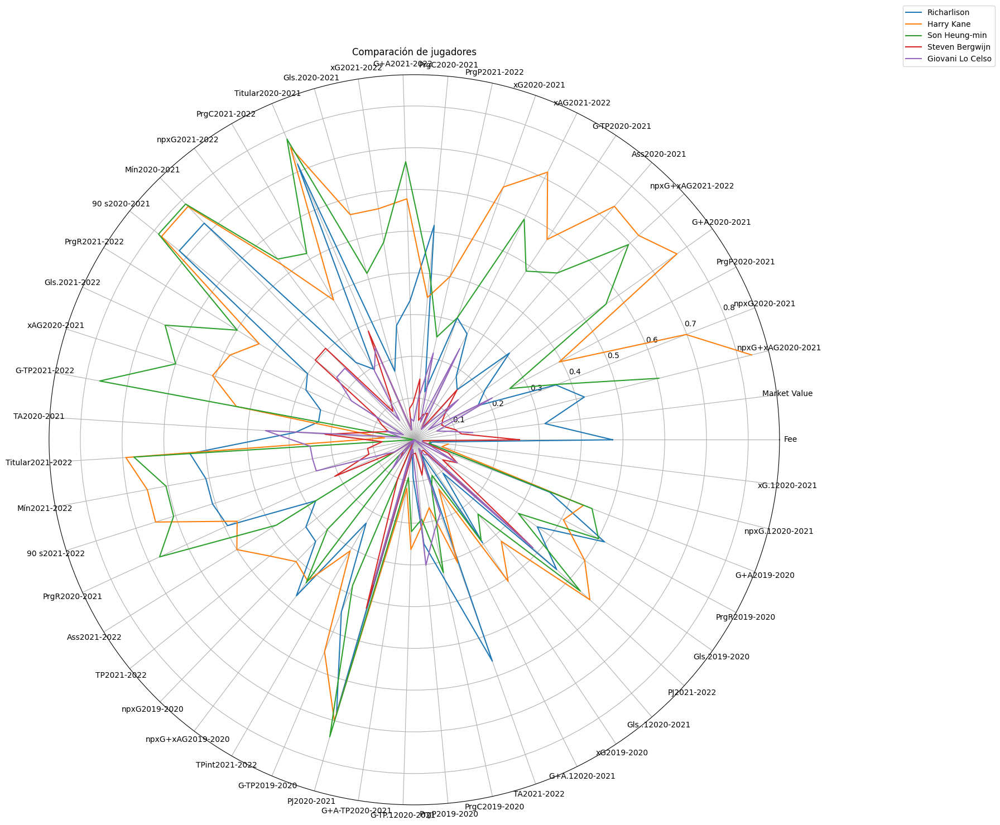

In [19]:
predict_fee('Richarlison')
knn(nombre_jugador_entrada='Harry Kane', k=20)
knn(nombre_jugador_entrada='Son Heung-min', k=20)
knn(nombre_jugador_entrada='Steven Bergwijn', k=20)
knn(nombre_jugador_entrada='Giovani Lo Celso', k=20)
calculate_distance('Richarlison', 'Harry Kane')
calculate_distance('Richarlison', 'Son Heung-min')

compare_players('Richarlison', 'Harry Kane', '2022-2023')
compare_players('Richarlison', 'Son Heung-min', '2022-2023')
compare_players('Richarlison', 'Steven Bergwijn', '2022-2023')
compare_players('Richarlison', 'Giovani Lo Celso', '2022-2023')

plot_radar_chart(['Richarlison', 'Harry Kane', 'Son Heung-min', 'Steven Bergwijn', 'Giovani Lo Celso'])

# Sadio Mané -> buen ejemplo
El bayern ha vendido a Robert Lewandowski y busca un delantero centro para sustituir a Robert Lewandowski


In [20]:
robert_lewandowski = 'Robert Lewandowski'

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
El valor de mercado predicho para el jugador Sadio Mané es: 51.66853332519531 millones de euros
Los 20 jugadores más similares a Robert Lewandowski son:
1 Cristiano Ronaldo con una distancia de 2.0357996322979286
2 Karim Benzema con una distancia de 2.089364053437654
3 Ciro Immobile con una distancia de 2.110854816076695
4 Kylian Mbappé con una distancia de 2.2732807734885894
5 Mohamed Salah con una distancia de 2.344439131830941
6 Harry Kane con una distancia de 2.4933648189045483
7 Lautaro Martínez con una distancia de 2.5736773094955443
8 Erling Haaland con una distancia de 2.5905502013830075
9 Wissam Ben Yedder con una distancia de 2.600091585138029
10 André Silva con una distancia de 2.7949749381100193
11 Sadio Mané con una distancia de 2.854375274568753
12 Wout Weghorst con una distancia de 2.885548586295429
13 Andy Delort con una distancia de 2.9031473053916326
14 Jamie Vardy con una distancia de 2.9154431972774915
15 Duván Zapata con una di

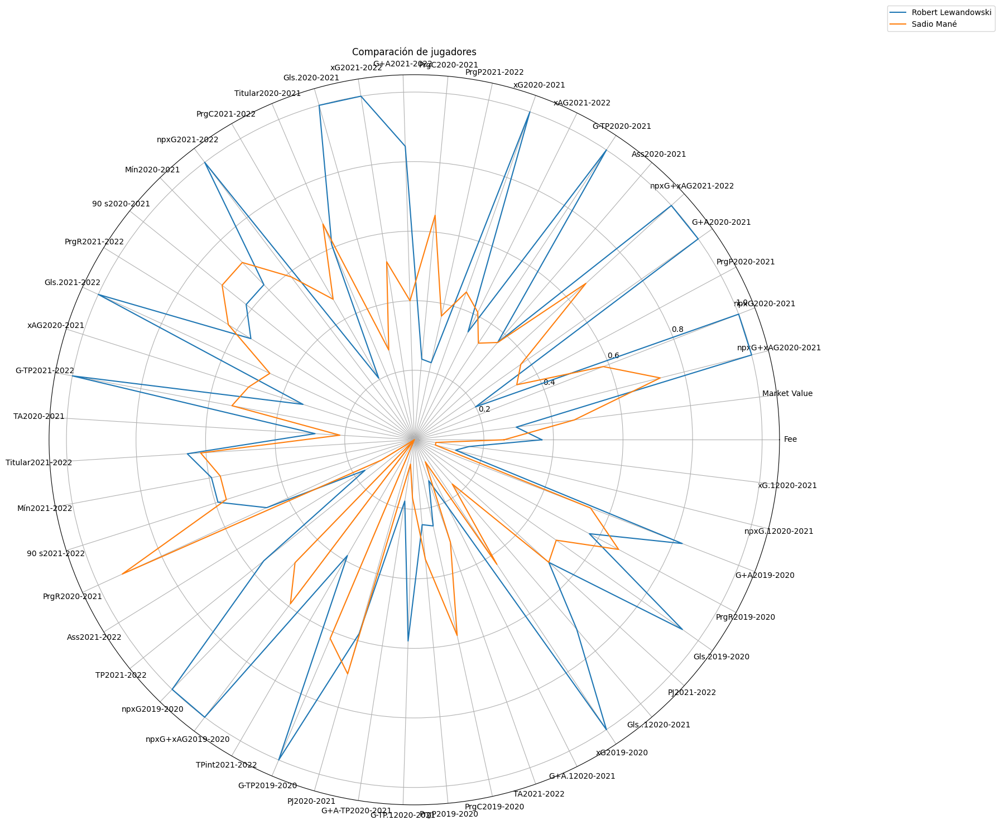

In [21]:
predict_fee('Sadio Mané')
knn(nombre_jugador_entrada=robert_lewandowski, k=20)
compare_players('Robert Lewandowski', 'Sadio Mané', '2022-2023')
calculate_distance('Robert Lewandowski', 'Sadio Mané')
plot_radar_chart(['Robert Lewandowski', 'Sadio Mané'])

# Ryan Gravenberch --> no es un buen ejemplo

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
El valor de mercado predicho para el jugador Ryan Gravenberch es: 0.9066763520240784 millones de euros
Los 20 jugadores más similares a Marc Roca son:
1 Davy Pröpper con una distancia de 0.2667912593691306
2 Dale Stephens con una distancia de 0.34576468691474394
3 Ibrahim Sangaré con una distancia de 0.36938829055936373
4 Simone Missiroli con una distancia de 0.41564745165819156
5 Panagiotis Tachtsidis con una distancia de 0.4300671728295429
6 Benjamin Hübner con una distancia de 0.43501208638537403
7 Matthias Zimmermann con una distancia de 0.43574793213927937
8 Ronaldo Vieira con una distancia de 0.43643575459446554
9 Jefferson Lerma con una distancia de 0.43835472173639256
10 Jack O'Connell con una distancia de 0.4487313442634847
11 Stefano Sabelli con una distancia de 0.4542772441853999
12 Lasse Schöne con una distancia de 0.4652592244871097
13 Stefano Denswil con una distancia de 0.47354227476772176
14 Fran Mérida con una distancia de 0.4798447

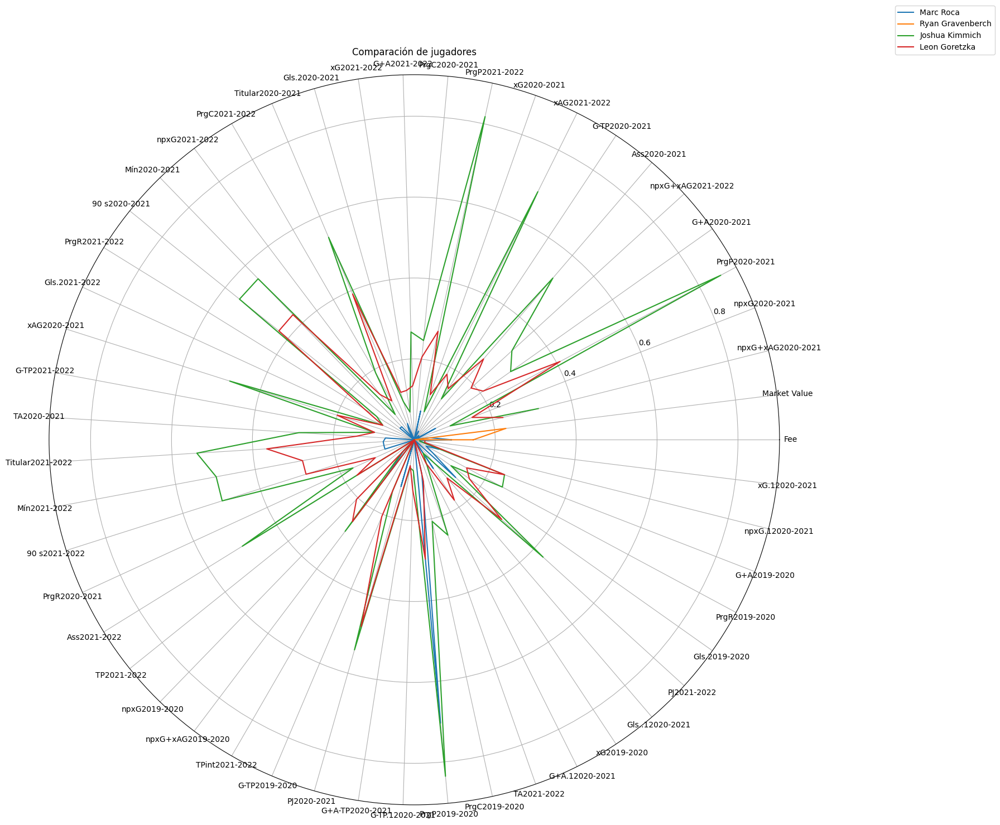

In [22]:
predict_fee('Ryan Gravenberch')
knn(nombre_jugador_entrada='Marc Roca', k=20)
knn(nombre_jugador_entrada='Joshua Kimmich', k=20)
knn(nombre_jugador_entrada='Leon Goretzka', k=20)

compare_players('Marc Roca', 'Ryan Gravenberch', '2022-2023')
compare_players('Joshua Kimmich', 'Ryan Gravenberch', '2022-2023')
compare_players('Leon Goretzka', 'Ryan Gravenberch', '2022-2023')

calculate_distance('Marc Roca', 'Ryan Gravenberch')
calculate_distance('Joshua Kimmich', 'Ryan Gravenberch')
calculate_distance('Leon Goretzka', 'Ryan Gravenberch')

compare_players('Marc Roca', 'Ryan Gravenberch', '2022-2023')

plot_radar_chart(['Marc Roca', 'Ryan Gravenberch', 'Joshua Kimmich', 'Leon Goretzka'])

# Robert Lewandowski
El barca busca un delantero centro para sustituir a Memphis Depay, a Luuk de Jong, a Martin Braithwaite, Pierre-Emerick Aubameyang

Los knn no se parecen a Robert Lewandowski pero cabe destacar que el BArcelona busca un delantero centro TOP
Por lo que habria que realizar un knn con jugadores TOP

Lewy ha sido mejor que todos los jugadores que se han ido del barça


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
El valor de mercado predicho para el jugador Robert Lewandowski es: 149.723388671875 millones de euros
Los 20 jugadores más similares a Memphis son:
1 Karl Toko Ekambi con una distancia de 0.9994814077863001
2 Henrikh Mkhitaryan con una distancia de 1.1186636079398815
3 Raphinha con una distancia de 1.1458368921185835
4 Mikel Oyarzabal con una distancia de 1.187405593137131
5 Amine Gouiri con una distancia de 1.1886478333708665
6 Andy Delort con una distancia de 1.1973185917431906
7 Iago Aspas con una distancia de 1.2360559301449165
8 Bruno Fernandes con una distancia de 1.2390869991124087
9 André Silva con una distancia de 1.2465014833027876
10 Antoine Griezmann con una distancia de 1.268660349037491
11 Ludovic Ajorque con una distancia de 1.28558389674776
12 Vincenzo Grifo con una distancia de 1.2913267192191988
13 Ángel Correa con una distancia de 1.2984788273132184
14 Duván Zapata con una distancia de 1.307417492841871
15 Andrea Belotti con una

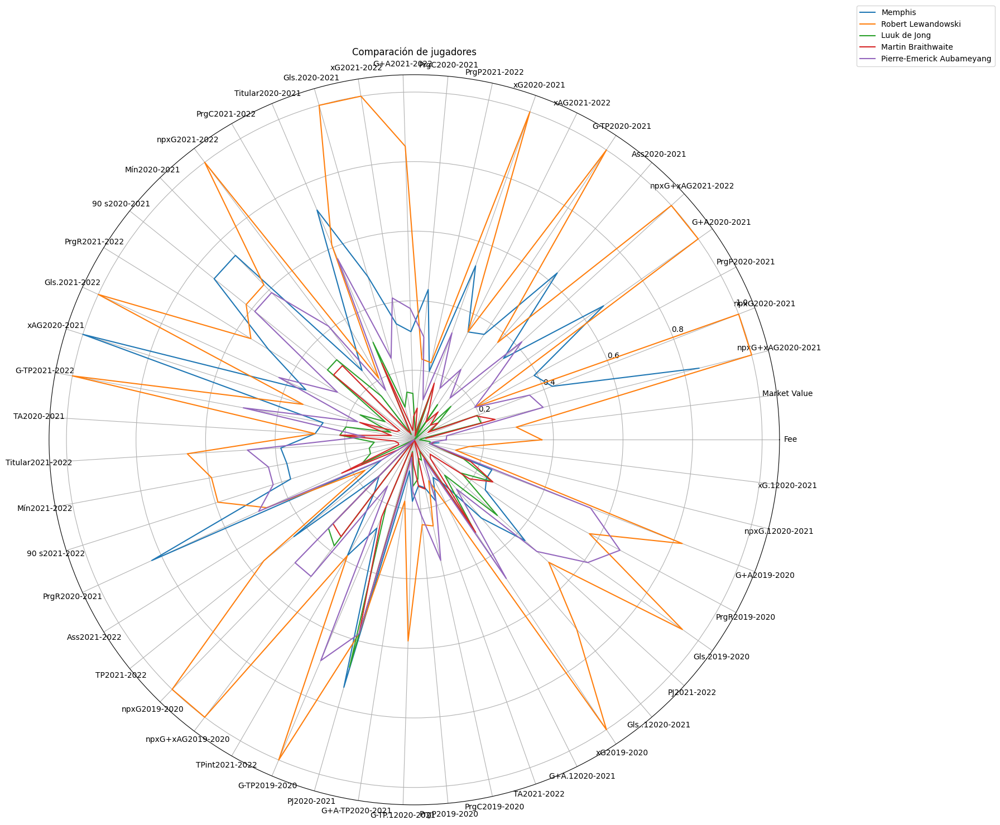

In [23]:
predict_fee('Robert Lewandowski')
knn(nombre_jugador_entrada='Memphis', k=20)
knn(nombre_jugador_entrada='Luuk de Jong', k=20)
knn(nombre_jugador_entrada='Martin Braithwaite', k=20)
knn(nombre_jugador_entrada='Pierre-Emerick Aubameyang', k=20)
# Comparamos con TOP
knn(nombre_jugador_entrada='Robert Lewandowski', k=20)

compare_players('Memphis', 'Robert Lewandowski', '2022-2023')
compare_players('Luuk de Jong', 'Robert Lewandowski', '2022-2023')
compare_players('Martin Braithwaite', 'Robert Lewandowski', '2022-2023')
compare_players('Pierre-Emerick Aubameyang', 'Robert Lewandowski', '2022-2023')

calculate_distance('Memphis', 'Robert Lewandowski')
calculate_distance('Luuk de Jong', 'Robert Lewandowski')
calculate_distance('Martin Braithwaite', 'Robert Lewandowski')
calculate_distance('Pierre-Emerick Aubameyang', 'Robert Lewandowski')


plot_radar_chart(['Memphis', 'Robert Lewandowski', 'Luuk de Jong', 'Martin Braithwaite', 'Pierre-Emerick Aubameyang'])

# Pierre-Emerick Aubameyang
El chelsea busca un delantero centro para sustituir a Timo Werner, a Romelu Lukaku


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
El valor de mercado predicho para el jugador Pierre-Emerick Aubameyang es: 40.68898010253906 millones de euros
Los 20 jugadores más similares a Timo Werner son:
1 Marcus Rashford con una distancia de 1.0111421062809012
2 Jamie Vardy con una distancia de 1.086700474244448
3 Jadon Sancho con una distancia de 1.1299598954885026
4 Andrea Belotti con una distancia de 1.1353886364709904
5 Pierre-Emerick Aubameyang con una distancia de 1.1467441573023869
6 Roberto Firmino con una distancia de 1.153825132787374
7 Danny Ings con una distancia de 1.1746040425523616
8 Gerard Moreno con una distancia de 1.2217255178767734
9 Duván Zapata con una distancia de 1.2386278894505574
10 Raheem Sterling con una distancia de 1.2540604869054677
11 Lucas Ocampos con una distancia de 1.2853626753657825
12 Romelu Lukaku con una distancia de 1.2908746349994358
13 Anthony Martial con una distancia de 1.2916719496730877
14 Josip Iličić con una distancia de 1.3067963895666974
1

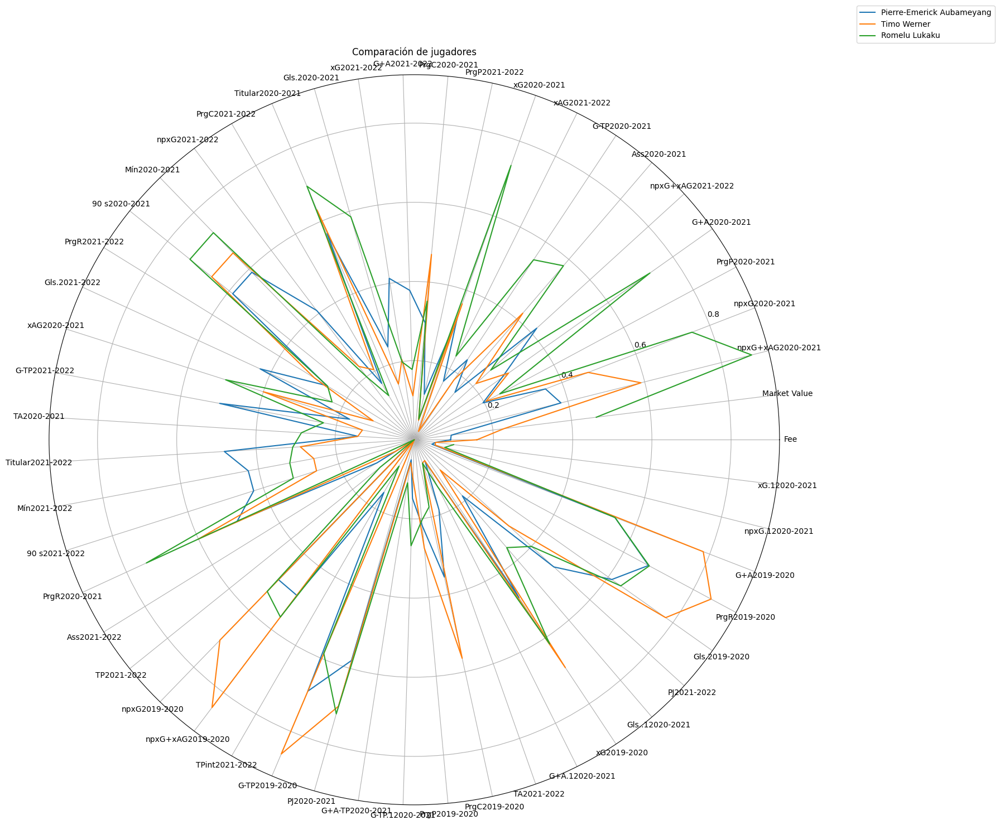

In [24]:
predict_fee('Pierre-Emerick Aubameyang')
knn(nombre_jugador_entrada='Timo Werner', k=20)
knn(nombre_jugador_entrada='Romelu Lukaku', k=20)

calculate_distance('Timo Werner', 'Pierre-Emerick Aubameyang')
calculate_distance('Romelu Lukaku', 'Pierre-Emerick Aubameyang')
compare_players('Timo Werner', 'Pierre-Emerick Aubameyang', '2022-2023')
compare_players('Romelu Lukaku', 'Pierre-Emerick Aubameyang', '2022-2023')

plot_radar_chart(['Pierre-Emerick Aubameyang', 'Timo Werner', 'Romelu Lukaku'])


# Antony -> no es un buen ejemplo

In [25]:
predict_fee('Antony')
knn(nombre_jugador_entrada='Andreas Pereira', k=20)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
El valor de mercado predicho para el jugador Antony es: 0.9066763520240784 millones de euros
Los 20 jugadores más similares a Andreas Pereira son:
1 Mijat Gaćinović con una distancia de 0.3638696823543837
2 Andrea Rispoli con una distancia de 0.37883528607643224
3 Javier Ontiveros con una distancia de 0.40799727544562964
4 Thierry Ambrose con una distancia de 0.4106292857076192
5 Marco Parolo con una distancia de 0.4148950983180087
6 Gastón Ramírez con una distancia de 0.41918842601492373
7 Recio con una distancia de 0.4236166445155078
8 Borja Valero con una distancia de 0.45083978372852646
9 Samu Castillejo con una distancia de 0.4600057815191594
10 Jacopo Petriccione con una distancia de 0.4730544511236147
11 Bryan Dabo con una distancia de 0.47421231397684194
12 Emiliano Rigoni con una distancia de 0.4749071332436753
13 Amadou Diawara con una distancia de 0.47709633944297614
14 Abdoul Kader Bamba con una distancia de 0.4788128693145281
15 Frédér

# Wesley Fofana -> no es un buen ejemplo
El chslea busca un central para sustituir  a Andreas Christensen, a Antonio Rudiger

In [26]:
Wesley ='Wesley Fofana'

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
El valor de mercado predicho para el jugador Wesley Fofana es: 4.309998989105225 millones de euros
Los 20 jugadores más similares a Andreas Christensen son:
1 Jack Cork con una distancia de 0.2848156158942113
2 Davinson Sánchez con una distancia de 0.2975907554193418
3 Nikola Maksimović con una distancia de 0.3069704385223792
4 Luca Ceppitelli con una distancia de 0.3305278103430392
5 Giorgio Chiellini con una distancia de 0.33386812267427945
6 Robin Koch con una distancia de 0.3350707519204015
7 Sean Longstaff con una distancia de 0.3396352852792083
8 Thilo Kehrer con una distancia de 0.3426612826768406
9 Nemanja Radoja con una distancia de 0.35136873846941796
10 Unai García con una distancia de 0.3531425202180284
11 Nathaniel Clyne con una distancia de 0.36364362304318454
12 Martin Agirregabiria con una distancia de 0.3799554695595251
13 Jacob Barrett Laursen con una distancia de 0.3832007450873072
14 Emil Krafth con una distancia de 0.3855228472

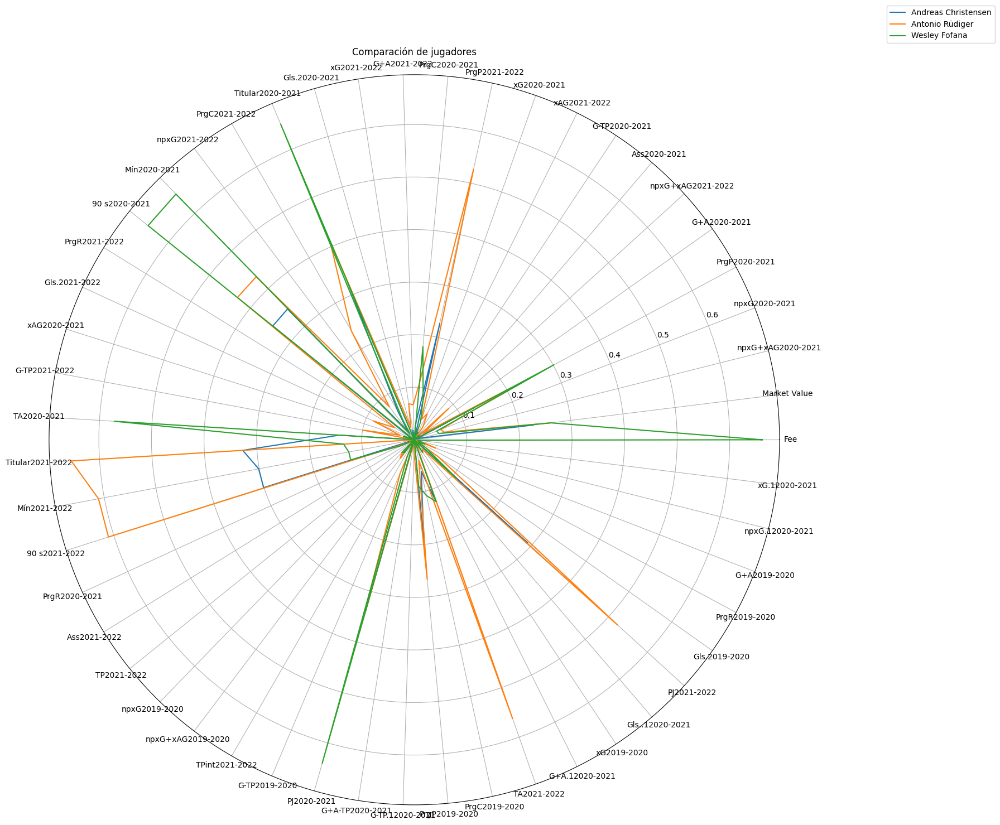

In [27]:
predict_fee('Wesley Fofana')
knn(nombre_jugador_entrada='Andreas Christensen', k=20)
knn(nombre_jugador_entrada='Antonio Rüdiger', k=20)
knn(nombre_jugador_entrada='Wesley Fofana', k=10)
calculate_distance('Andreas Christensen', 'Wesley Fofana')
calculate_distance('Antonio Rüdiger', 'Wesley Fofana')
compare_players('Andreas Christensen', 'Wesley Fofana', '2022-2023')
compare_players('Antonio Rüdiger', 'Wesley Fofana', '2022-2023')
plot_radar_chart(['Andreas Christensen', 'Antonio Rüdiger', 'Wesley Fofana'])

# Alexander Isak -> es un buen ejemplo de la red
El Newcastle busca un delantero centro para acompañar a su delantero centro Callum Wilson

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
El valor de mercado predicho para el jugador Alexander Isak es: 65.57643127441406 millones de euros
Los 20 jugadores más similares a Alexander Isak son:
1 Youssef En-Nesyri con una distancia de 0.8850514999930644
2 Santi Mina con una distancia de 0.8859561982243879
3 Luis Suárez con una distancia de 0.8968412612696892
4 Kiké con una distancia de 0.9251605405927388
5 Hwang Ui-jo con una distancia de 0.934511651978788
6 Roger Martí con una distancia de 0.9410145989726845
7 Alexandre Lacazette con una distancia de 0.9550822212253612
8 Antoine Griezmann con una distancia de 0.9563914302087355
9 Fabio Quagliarella con una distancia de 0.9574204982772132
10 Ante Budimir con una distancia de 1.0004237858937457
11 Ludovic Ajorque con una distancia de 1.000990512905076
12 Dominic Calvert-Lewin con una distancia de 1.003230751445064
13 Neal Maupay con una distancia de 1.0104125663158354
14 Habib Diallo con una distancia de 1.0212251370434842
15 Boulaye Dia co

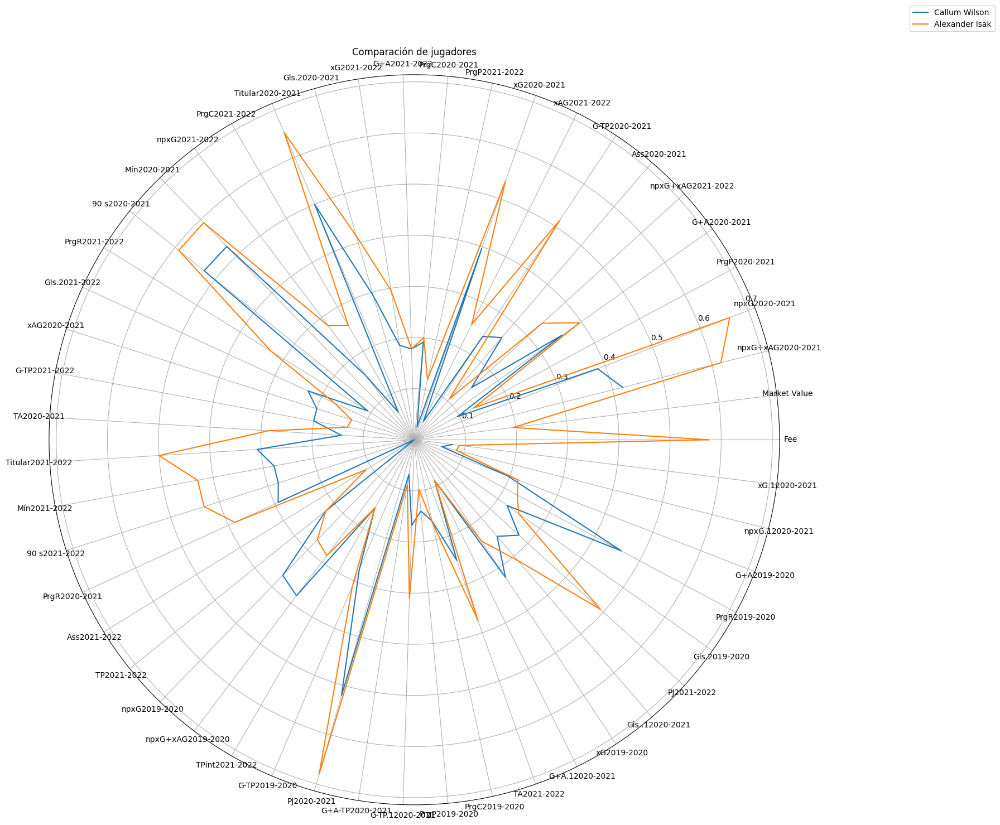

In [28]:
predict_fee('Alexander Isak')
knn(nombre_jugador_entrada='Alexander Isak', k=20)
compare_players('Callum Wilson', 'Alexander Isak', '2022-2023')
calculate_distance('Callum Wilson', 'Alexander Isak')
plot_radar_chart(['Callum Wilson', 'Alexander Isak'])


# Matheus Nunes -> no es un buen ejemplo

In [29]:
predict_fee('Matheus Nunes')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
El valor de mercado predicho para el jugador Matheus Nunes es: 0.9066763520240784 millones de euros


0.90667635

# Timo Werner
El leipzig busca un delantero centro para sustituir a Alexander Sorloth, Ademola Lookman, Hee-Chan Hwang y Brian Brobbey
EL algoritmo de knn no funciona bien en este caso
El fichaje se realizado debido a que Timo Werner no ha rendido como se esperaba en el chelsea y vuelva a su antiguo club
El leipzig ha pagado un total de 26 millones por Timo Werner

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
El valor de mercado predicho para el jugador Timo Werner es: 37.60919189453125 millones de euros
Los 20 jugadores más similares a Alexander Sørloth son:
1 Brahim Díaz con una distancia de 0.4385527006333803
2 Arnaud Nordin con una distancia de 0.5193767470134072
3 Timothy Weah con una distancia de 0.5308518309479653
4 Dani Gómez con una distancia de 0.5392833152361426
5 Danny Welbeck con una distancia de 0.5439262916768154
6 Daniel Podence con una distancia de 0.5487743956558987
7 Hakim Ziyech con una distancia de 0.5498743635252958
8 Eldor Shomurodov con una distancia de 0.5551417042289408
9 Jeffrey Schlupp con una distancia de 0.5574080056469121
10 Marko Pjaca con una distancia de 0.559358222486777
11 Jacob Murphy con una distancia de 0.5615549929957714
12 Marco Asensio con una distancia de 0.5783686167039953
13 Roland Sallai con una distancia de 0.5817130527167016
14 Oihan Sancet con una distancia de 0.5838810137396964
15 Emile Smith Rowe con un

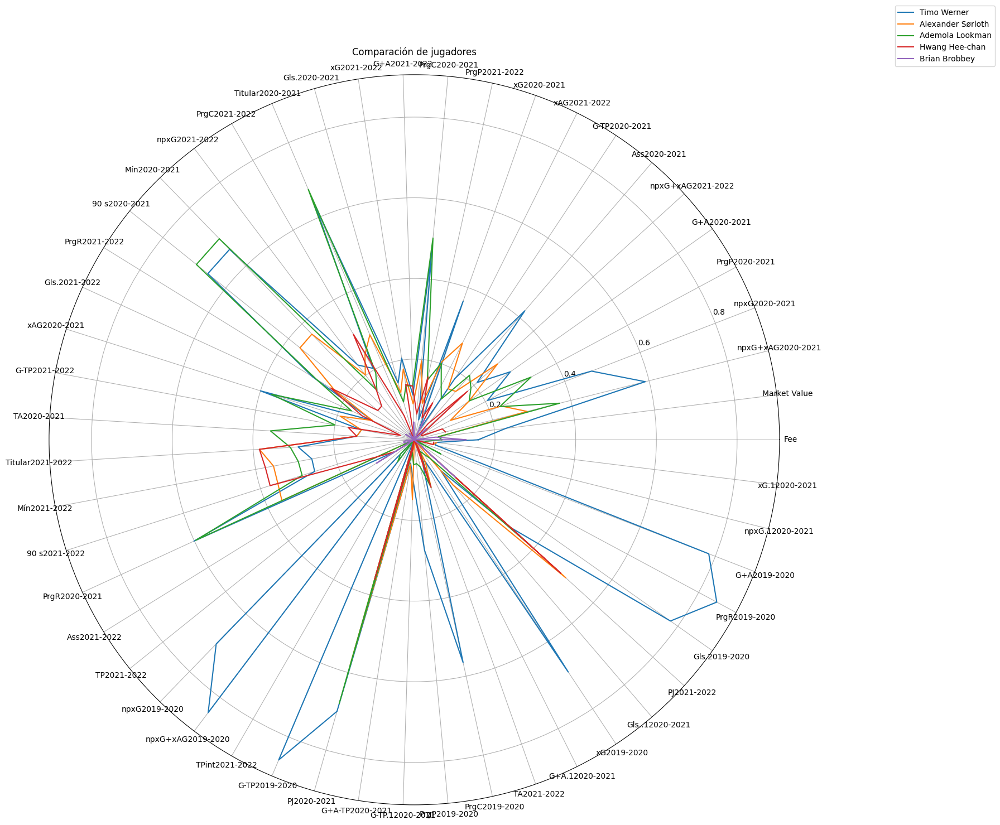

In [30]:
predict_fee('Timo Werner')
knn(nombre_jugador_entrada='Alexander Sørloth', k=20)
knn(nombre_jugador_entrada='Ademola Lookman', k=20)
knn(nombre_jugador_entrada='Hwang Hee-chan', k=20)
knn(nombre_jugador_entrada='Brian Brobbey', k=20)

compare_players('Alexander Sørloth', 'Timo Werner', '2022-2023')
compare_players('Ademola Lookman', 'Timo Werner', '2022-2023')
compare_players('Hwang Hee-chan', 'Timo Werner', '2022-2023')
compare_players('Brian Brobbey', 'Timo Werner', '2022-2023')

calculate_distance('Alexander Sørloth', 'Timo Werner')
calculate_distance('Ademola Lookman', 'Timo Werner')
calculate_distance('Hwang Hee-chan', 'Timo Werner')
calculate_distance('Brian Brobbey', 'Timo Werner')

plot_radar_chart(['Timo Werner', 'Alexander Sørloth', 'Ademola Lookman', 'Hwang Hee-chan', 'Brian Brobbey'])

# Marc Cucurella
El chelsea busca un lateral izquierdo para sustituir a Emerson, a Marcos Alonso ó que se parezca a Ben Chilwell

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
El valor de mercado predicho para el jugador Marc Cucurella es: 5.548894882202148 millones de euros
Los 20 jugadores más similares a Emerson son:
1 Nahitan Nández con una distancia de 0.5164759516692334
2 Nélson Semedo con una distancia de 0.5610519842054775
3 Thomas Foket con una distancia de 0.6317285532950753
4 Hugo Mallo con una distancia de 0.6319176620530537
5 Sergio Reguilón con una distancia de 0.6421255029218799
6 Aaron Wan-Bissaka con una distancia de 0.6642578652242034
7 José Luis Gayà con una distancia de 0.6702068466945955
8 Arkadiusz Reca con una distancia de 0.6785547161098971
9 Hassane Kamara con una distancia de 0.6829819174495119
10 Pol Lirola con una distancia de 0.686019010494739
11 Lucas Digne con una distancia de 0.6929154434341389
12 Adrien Rabiot con una distancia de 0.6962159434052739
13 Gaetano Castrovilli con una distancia de 0.7063435445796161
14 Davide Faraoni con una distancia de 0.7073605163151626
15 Marc Cucurella co

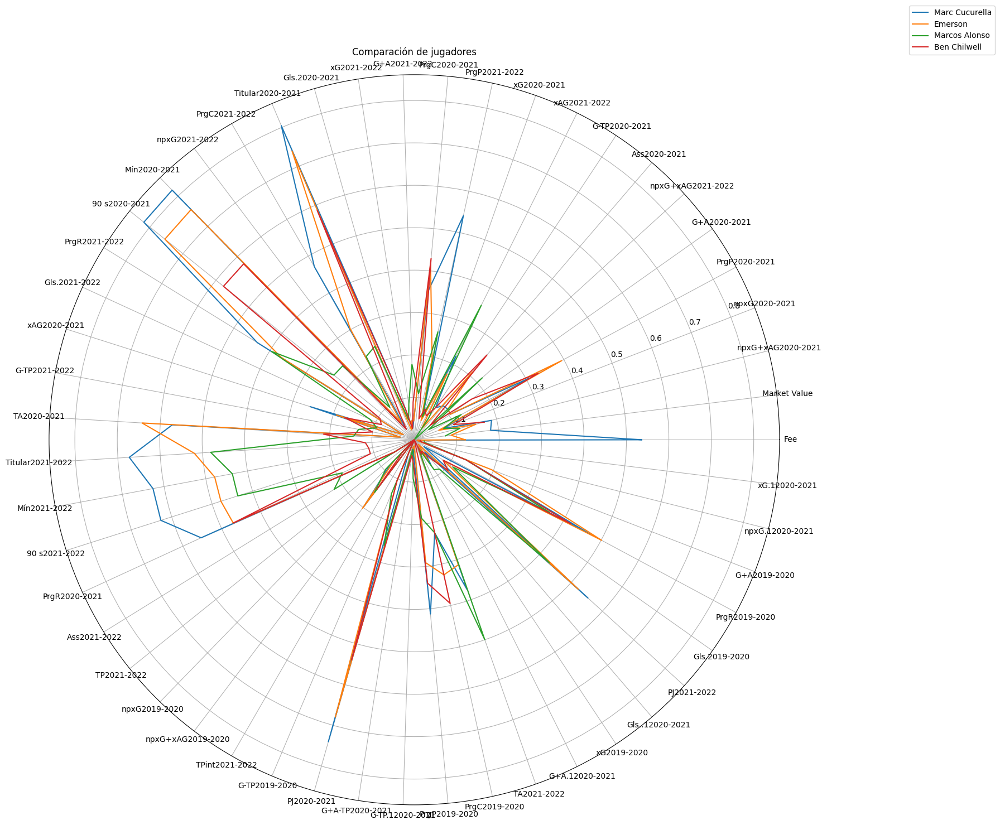

In [31]:
predict_fee('Marc Cucurella')
knn(nombre_jugador_entrada='Emerson', k=20)
knn(nombre_jugador_entrada='Marcos Alonso', k=20)
knn(nombre_jugador_entrada='Ben Chilwell', k=20)

compare_players('Emerson', 'Marc Cucurella', '2022-2023')
compare_players('Marcos Alonso', 'Marc Cucurella', '2022-2023')
compare_players('Ben Chilwell', 'Marc Cucurella', '2022-2023')

calculate_distance('Emerson', 'Marc Cucurella')
calculate_distance('Marcos Alonso', 'Marc Cucurella')
calculate_distance('Ben Chilwell', 'Marc Cucurella')


plot_radar_chart(['Marc Cucurella', 'Emerson', 'Marcos Alonso', 'Ben Chilwell'])

# Federico Chiesa
La juventus busca un extremo para sustituir a Dybala, a Federico Bernardeschi, a Dejan Kulusevski


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
El valor de mercado predicho para el jugador Federico Chiesa es: 56.415889739990234 millones de euros
Los 20 jugadores más similares a Paulo Dybala son:
1 Kai Havertz con una distancia de 0.5339496449163341
2 Philippe Coutinho con una distancia de 0.5917098719063063
3 Mario Pašalić con una distancia de 0.5924443200235938
4 Lucas Pérez con una distancia de 0.688027085207137
5 Alassane Pléa con una distancia de 0.690553297299919
6 Breel Embolo con una distancia de 0.7030336115084659
7 Ferrán Torres con una distancia de 0.7118409268132125
8 Riccardo Orsolini con una distancia de 0.7272553119594262
9 Julian Brandt con una distancia de 0.7355345742336551
10 David Silva con una distancia de 0.7773503450485169
11 Dries Mertens con una distancia de 0.7884185737793419
12 Rodrigo con una distancia de 0.7920814897098117
13 Christian Pulisic con una distancia de 0.795963169628343
14 Willian José con una distancia de 0.7978277175980127
15 Lucas Moura con una di

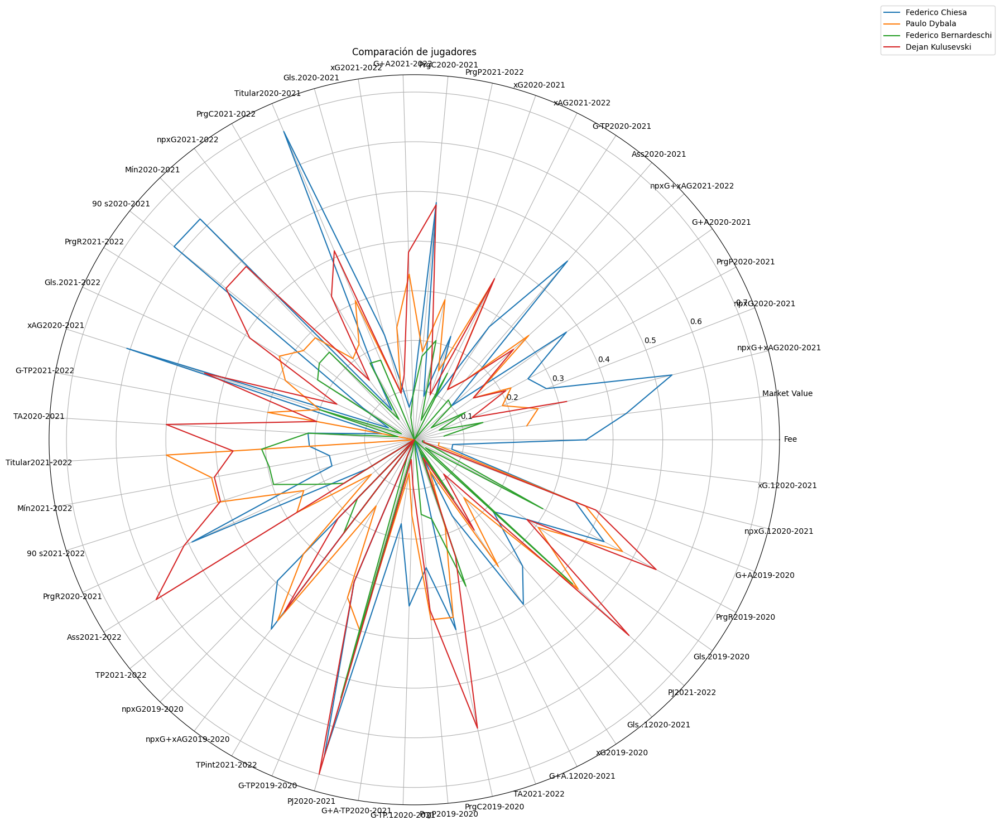

In [32]:
predict_fee('Federico Chiesa') # 44,6M
knn(nombre_jugador_entrada='Paulo Dybala', k=20)
knn(nombre_jugador_entrada='Federico Bernardeschi', k=20)
knn(nombre_jugador_entrada='Dejan Kulusevski', k=20)

compare_players('Paulo Dybala', 'Federico Chiesa', '2022-2023')
compare_players('Federico Bernardeschi', 'Federico Chiesa', '2022-2023')
compare_players('Dejan Kulusevski', 'Federico Chiesa', '2022-2023')

calculate_distance('Paulo Dybala', 'Federico Chiesa')
calculate_distance('Federico Bernardeschi', 'Federico Chiesa')
calculate_distance('Dejan Kulusevski', 'Federico Chiesa')

plot_radar_chart(['Federico Chiesa', 'Paulo Dybala', 'Federico Bernardeschi', 'Dejan Kulusevski'])

# Carlos Soler
El psg busca un mediocentro para sustituir a Idrissa Gueye, a Leandro Paredes, Rafinha, Ander Herrera

Los 20 jugadores más similares a Idrissa Gana Gueye son:
1 Thomas Partey con una distancia de 0.3662774880230432
2 Mateo Kovačić con una distancia de 0.3828650216152967
3 Charles Aránguiz con una distancia de 0.4252406454991445
4 Thiago Mendes con una distancia de 0.4314416384205073
5 Andrés Guardado con una distancia de 0.4315446210900207
6 Ismaël Bennacer con una distancia de 0.4316163340684986
7 Florian Grillitsch con una distancia de 0.43900882185795914
8 Elseid Hysaj con una distancia de 0.4573110685628569
9 Thiago Alcántara con una distancia de 0.46010033914761395
10 Alex Sandro con una distancia de 0.46275516086243446
11 Martín Cáceres con una distancia de 0.4815257148914192
12 Lukas Klostermann con una distancia de 0.48257392313932074
13 Alfred Duncan con una distancia de 0.4834253543874878
14 Óliver Torres con una distancia de 0.4896953891137074
15 Fred con una distancia de 0.4940123004498795
16 Denis Zakaria con una distancia de 0.5092710521736336
17 Aritz Elustondo con una d

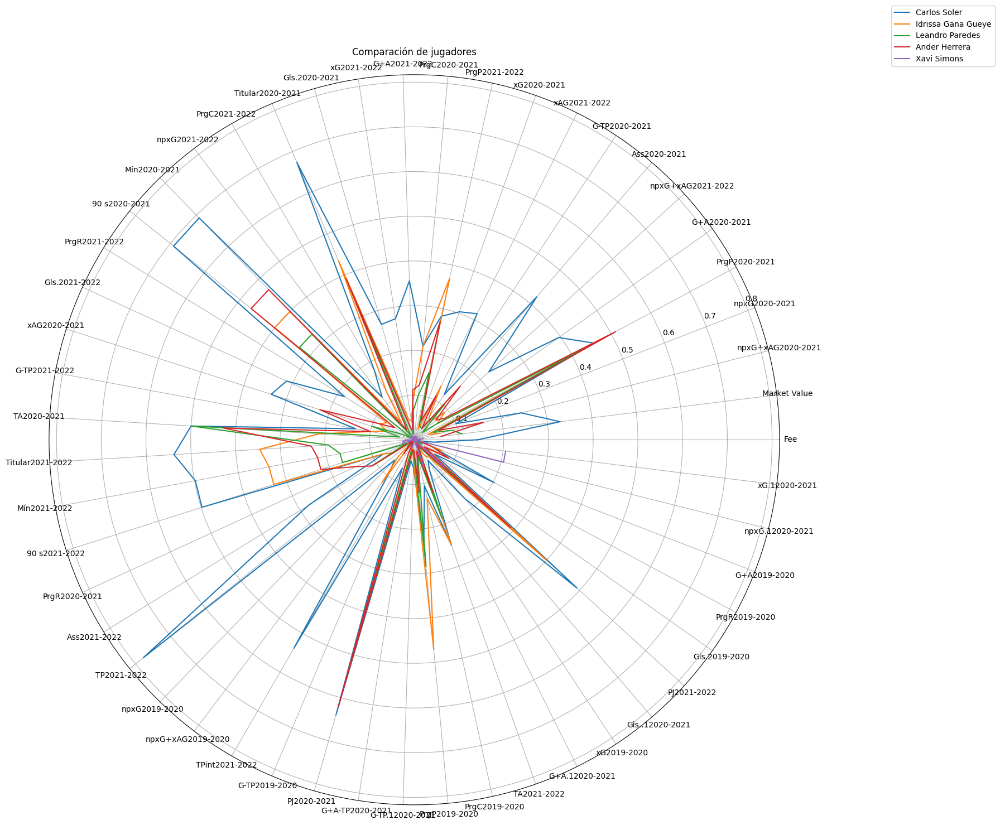

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
El valor de mercado predicho para el jugador Carlos Soler es: 31.848142623901367 millones de euros


31.848143

In [33]:
knn('Idrissa Gana Gueye',k=20)
knn('Leandro Paredes',k=20)
knn('Rafinha',k=20)
knn('Ander Herrera',k=20)
knn('Xavi Simons',k=20)

compare_players('Idrissa Gana Gueye','Carlos Soler','2022-2023')
compare_players('Leandro Paredes','Carlos Soler','2022-2023')
compare_players('Rafinha','Carlos Soler','2022-2023')
compare_players('Ander Herrera','Carlos Soler','2022-2023')
compare_players('Xavi Simons','Carlos Soler','2022-2023')

plot_radar_chart(['Carlos Soler','Idrissa Gana Gueye','Leandro Paredes','Ander Herrera','Xavi Simons'])


predict_fee('Carlos Soler') # 18M

# Amine Gouiri
El Stade Rennais busca un extremo izquierdo para sustituir a Kamaldeen Sulemana, Mathys Tel, Gaëtan Laborde que es un delantero centro

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
El valor de mercado predicho para el jugador Amine Gouiri es: 43.195411682128906 millones de euros
Los 20 jugadores más similares a Kamaldeen Sulemana son:
1 Amine Adli con una distancia de 0.21845759915785953
2 Nuno Tavares con una distancia de 0.24174318798236463
3 Youcef Belaïli con una distancia de 0.2543156741467306
4 Jesús Corona con una distancia de 0.26030780082917104
5 Vanderson con una distancia de 0.26056519357761665
6 Kevin Schade con una distancia de 0.2666741917829045
7 Dango Ouattara con una distancia de 0.28173743847829136
8 Calvin Stengs con una distancia de 0.2819101912364433
9 Tiago Tomás con una distancia de 0.28207104827534485
10 Enock Mwepu con una distancia de 0.2825374635920997
11 Éderson con una distancia de 0.2849714945125997
12 Luis Díaz con una distancia de 0.2874758251533153
13 Bebé con una distancia de 0.2899819574526221
14 Kostas Tsimikas con una distancia de 0.2924537007182831
15 Nadir Zortea con una distancia de 0.2

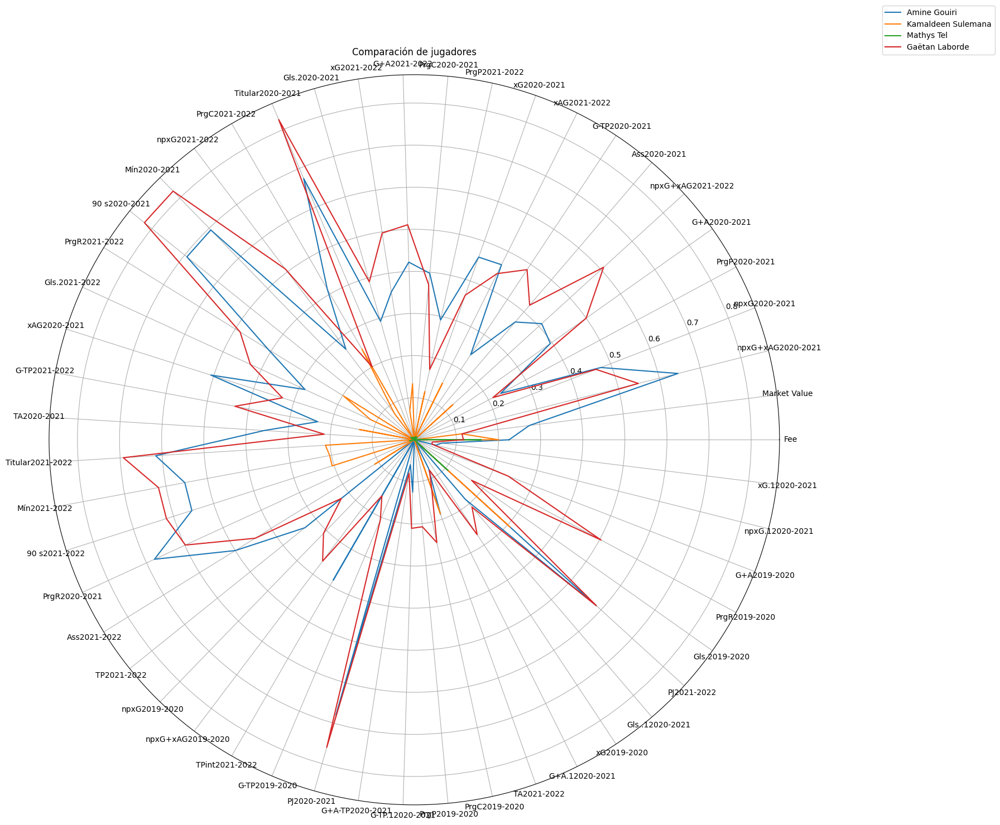

In [34]:
predict_fee('Amine Gouiri') # 28M
knn('Kamaldeen Sulemana',k=20)
knn('Mathys Tel',k=20)
knn('Gaëtan Laborde',k=20)

compare_players('Kamaldeen Sulemana','Amine Gouiri','2022-2023')
compare_players('Mathys Tel','Amine Gouiri','2022-2023')
compare_players('Gaëtan Laborde','Amine Gouiri','2022-2023')

calculate_distance('Kamaldeen Sulemana','Amine Gouiri')
calculate_distance('Mathys Tel','Amine Gouiri')
calculate_distance('Gaëtan Laborde','Amine Gouiri')

plot_radar_chart(['Amine Gouiri','Kamaldeen Sulemana','Mathys Tel','Gaëtan Laborde'])

# Carney Chukwuemeka
El Chelsea busca un mediocentro para sustituir a Jorginho, Billy Gilmour

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
El valor de mercado predicho para el jugador Carney Chukwuemeka es: 13.156335830688477 millones de euros
Los 20 jugadores más similares a Jorginho son:
1 Thomas Mangani con una distancia de 0.666344282846768
2 Emre Can con una distancia de 0.8009008437371793
3 Domenico Criscito con una distancia de 0.8023242804350775
4 Leonardo Bonucci con una distancia de 0.8277329089130225
5 Fabinho con una distancia de 0.8988369733476412
6 Ivan Rakitić con una distancia de 0.9178157246361242
7 Saša Lukić con una distancia de 0.9417476131538405
8 Jordan Veretout con una distancia de 0.958184778629943
9 Emil Forsberg con una distancia de 0.9724681497977087
10 Gonzalo Melero con una distancia de 0.9762946463764326
11 Kerem Demirbay con una distancia de 0.9907427837667206
12 Ramy Bensebaini con una distancia de 0.9914859806150048
13 Carlos Soler con una distancia de 0.9939366141935655
14 Daniel Caligiuri con una distancia de 1.0023874404988204
15 Enis Bardhi con una

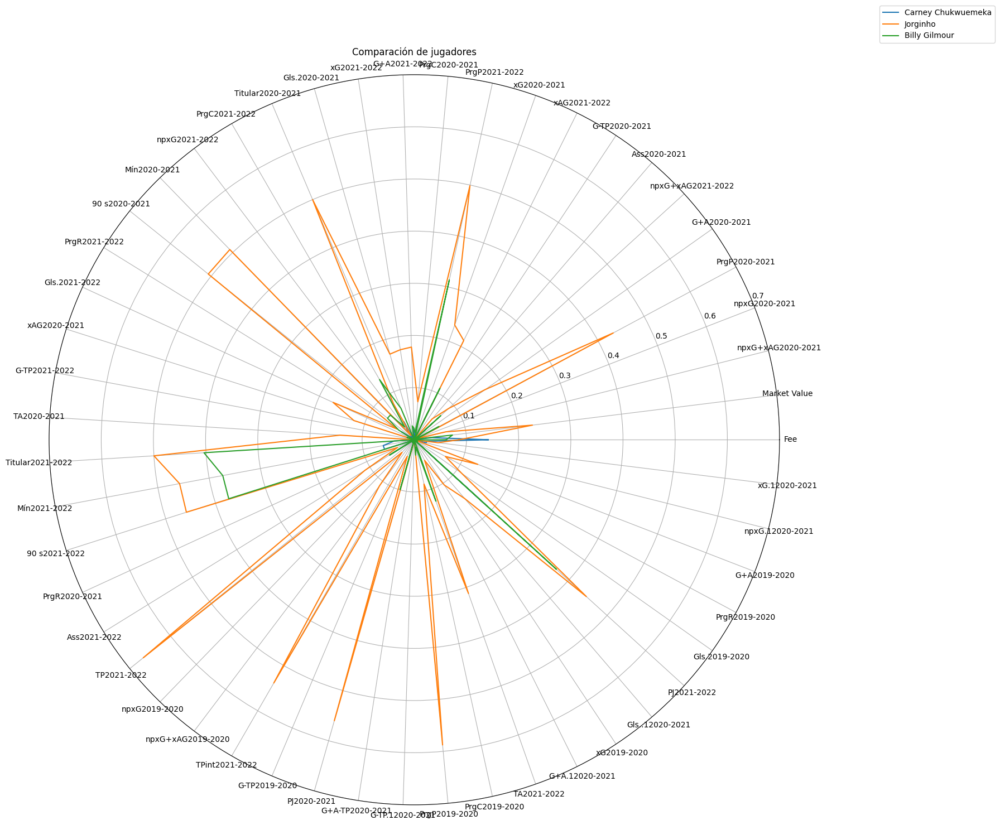

In [35]:
predict_fee('Carney Chukwuemeka') # 18M
knn('Jorginho',k=20)
knn('Billy Gilmour',k=20)

compare_players('Jorginho','Carney Chukwuemeka','2022-2023')
compare_players('Billy Gilmour','Carney Chukwuemeka','2022-2023')
calculate_distance('Jorginho','Carney Chukwuemeka')
calculate_distance('Billy Gilmour','Carney Chukwuemeka')

plot_radar_chart(['Carney Chukwuemeka','Jorginho','Billy Gilmour'])


Si queremos ver más


In [36]:
predict_fee('Diego Carlos') # 30M
predict_fee('Karim Adeyemi') # 30M
predict_fee('Yves Bissouma') # 29,2M
predict_fee('Joaquín Correa') # 27,3M

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
El valor de mercado predicho para el jugador Diego Carlos es: 6.589045524597168 millones de euros
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
El valor de mercado predicho para el jugador Karim Adeyemi es: 0.9066763520240784 millones de euros
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
El valor de mercado predicho para el jugador Yves Bissouma es: 5.46625280380249 millones de euros
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
El valor de mercado predicho para el jugador Joaquín Correa es: 31.625207901000977 millones de euros


31.625208